In [6]:
import matplotlib.pyplot as plt
from pykowski.karambola import KarambolaResults
import numpy as np
import json
import os
from collections import defaultdict
%matplotlib inline

In [28]:
sample_names =["beadpack", "ketton","bentheimer", "estaillades", "doddington",
               "S1", "S2", "S3", "S4", "S5", "S6", "S7", "S8", "S9", "C1", "C2","Berea",
              "Isotropic12", "Isotropic13", "Isotropic14", "Anisotropic121214", "Anisotropic131314"]

In [29]:
minkowski_data = {}
for sample_name in sample_names:
    minkowski_data[sample_name] = {}
    
    json_files = []
    
    for file in os.listdir("minkowski_results/karambola_output/"+sample_name):
        if file.endswith(".json"):
            json_files.append(file)

    dxs = []
    results = []
    for file_name in json_files:
        data = None
        with open("minkowski_results/karambola_output/"+sample_name+"/"+file_name, 'r') as f:
            for row in f:
                data = row
        name = file_name.split("_")
        dx = int(name[0])
        json_data = json.loads(data)
        karam_res = KarambolaResults()
        karam_res.load_from_json_format(json_data)
        #if karam_res.w202 is not 'ERROR' and karam_res.w102 is not 'ERROR':
        try:
            karam_res.compute_eigenvalues()
            dxs.append(dx)
            results.append(karam_res)
        except:
            print "Non-Manifold mesh in "+file_name
    w102s = [x.w102/x.w100 for x in results]
    w202s = [x.w202/x.w200 for x in results]
    beta_102s = [x.beta_102 for x in results]
    beta_202s = [x.beta_202 for x in results]
    gamma_102s = [x.gamma_102 for x in results]
    gamma_202s = [x.gamma_202 for x in results]

    dxs_sorted = sorted(dxs)
    w102s_sorted = [x for (y,x) in sorted(zip(dxs, w102s))]
    w202s_sorted = [x for (y,x) in sorted(zip(dxs, w202s))]
    beta_102s_sorted = [x for (y,x) in sorted(zip(dxs, beta_102s))]
    beta_202s_sorted = [x for (y,x) in sorted(zip(dxs, beta_202s))]
    gamma_102s_sorted = [x for (y,x) in sorted(zip(dxs, gamma_102s))]
    gamma_202s_sorted = [x for (y,x) in sorted(zip(dxs, gamma_202s))]
    minkowski_data[sample_name]["dx"] = dxs_sorted
    minkowski_data[sample_name]["beta_102"] = beta_102s_sorted
    minkowski_data[sample_name]["beta_202"] = beta_202s_sorted
    minkowski_data[sample_name]["gamma_102"] = gamma_102s
    minkowski_data[sample_name]["gamma_202"] = gamma_202s
    minkowski_data[sample_name]["w102"] = w102s_sorted
    minkowski_data[sample_name]["w202"] = w202s_sorted

C:\Users\lmosser\Anaconda2\lib\site-packages\ipykernel\__main__.py:31: RuntimeWarning: invalid value encountered in divide


In [30]:
print minkowski_data["Anisotropic131314"]["w102"][-1]
print minkowski_data["Anisotropic131314"]["beta_102"][-1]

[[  3.61361251e-01  -2.48194165e-05   1.11154539e-04]
 [ -2.48194165e-05   3.61482825e-01   1.08364854e-04]
 [  1.11154539e-04   1.08364854e-04   2.77155924e-01]]
0.766708176863


In [31]:
for name in sample_names:
    print name
    print "w102"
    print minkowski_data[name]["w102"][-1]
    print ""
    print "w202"
    print minkowski_data[name]["w202"][-1]
    print ""
    print "beta102"
    print minkowski_data[name]["beta_102"][-1]
    print ""
    print "beta202"
    print minkowski_data[name]["beta_202"][-1]
    print ""
    print ""

beadpack
w102
[[  3.33172625e-01   3.27044167e-04  -2.39223338e-04]
 [  3.27044167e-04   3.33988026e-01  -1.71854777e-04]
 [ -2.39223338e-04  -1.71854777e-04   3.32839350e-01]]

w202
[[ 0.39463984 -0.07301587  0.02473921]
 [-0.07301587  0.25493396  0.00969418]
 [ 0.02473921  0.00969418  0.3504262 ]]

beta102
0.995708532162

beta202
0.513499193935


ketton
w102
[[ 0.30629152  0.02524857 -0.00302229]
 [ 0.02524857  0.32197558  0.00437719]
 [-0.00302229  0.00437719  0.3717329 ]]

w202
[[ 0.32152188  0.00492119  0.00035355]
 [ 0.00492119  0.33026337  0.00084599]
 [ 0.00035355  0.00084599  0.34821475]]

beta102
0.77230258657

beta202
0.916853480618


bentheimer
w102
[[ 0.32166137  0.00821532 -0.00513982]
 [ 0.00821532  0.32064166  0.0083614 ]
 [-0.00513982  0.0083614   0.35769697]]

w202
[[ 0.32367514  0.00386943 -0.00206591]
 [ 0.00386943  0.32347979  0.00607073]
 [-0.00206591  0.00607073  0.35284508]]

beta102
0.864195709354

beta202
0.900015310184


estaillades
w102
[[ 0.31556637 -0.0039

In [32]:
permeability_file = "permeability_results/permeability_tensors_edit.json"
with open(permeability_file) as data_file:
    permeability = json.load(data_file)

In [41]:
for name in sample_names:
    print name
    print permeability[name]["kx"]/9.87e-13
    print permeability[name]["ky"]/9.87e-13
    print permeability[name]["kz"]/9.87e-13
    print permeability[name]["phi_eff"]
    print ""

beadpack
6.18642350557
6.32624113475
6.19756838906
0.362

ketton
5.10334346505
3.45592705167
3.26139817629
0.127168

bentheimer
2.77912867275
2.86626139818
2.32928064843
0.201

estaillades
0.15671935157
0.0746051671733
0.117313069909
0.101394

doddington
0.313069908815
0.308004052685
0.268490374873
0.189

S1
1.99493414387
1.77507598784
1.32928064843
0.141

S2
4.3748733536
4.03546099291
3.43870314083
0.246

S3
0.144883485309
0.425531914894
0.110435663627
0.169

S4
0.276595744681
0.292806484296
0.217831813576
0.171

S5
4.74468085106
4.93819655522
4.49848024316
0.211

S6
11.4376899696
10.8237082067
11.0952380952
0.24

S7
7.36372847011
7.69402228977
6.11651469098
0.251

S8
13.2350557244
13.6849037487
13.1063829787
0.34

S9
2.77102330294
2.12056737589
1.86828774063
0.222

C1
0.795339412361
1.4883485309
1.06686930091
0.233

C2
0.0385005065856
0.163120567376
0.0182370820669
0.168

Berea
1.37791286727
1.32117527862
1.20871327254
0.196

Isotropic12
8.6210739615
8.61803444782
8.62310030395
0.205

In [26]:
title_size = 34
xLabel_size = 32
yLabel_size = xLabel_size
tick_mark_label_size = 28
legend_size = 28
line_width = 4
bbox = (0., 0.1, 0.95, .102)
bbox_comp = (0., 0.25, 0.95, .102)
gamma_alpha = 0.6

In [27]:
for sample_name in sample_names:
    fig, ax = plt.subplots(figsize=(16,16))
    dx = minkowski_data[sample_name]["dx"]
    beta1 = minkowski_data[sample_name]["beta_102"]
    beta2 = minkowski_data[sample_name]["beta_202"]
    
    ax.set_xlim(0, dx[-1]+2)
    ax.set_ylim(0.0, 1.0)

    #ax.set_title(r'$Anisotropy \ Indices \ \beta_{1}^{0,2}, \ \beta_{2}^{0,2}  \ versus \ Window \ Size \ r$', fontsize=title_size, y=1.02)

    ax.set_xlabel(r'$Window \ Size \ r$', fontsize=xLabel_size)
    ax.set_ylabel(r'$Anisotropy \ Index \ \beta_{1}^{0,2}, \ Anisotropy \ Index \ \beta_{2}^{0,2}$', fontsize=yLabel_size)

    ax.plot(dx, beta1, color="blue", label=r'$Anisotropy \ Index \ \beta_{1}^{0,2}$', alpha=1.0, linestyle="-", linewidth=line_width)
    ax.plot(dx, beta2, color="green", label=r'$Anisotropy \ Index \ \beta_{2}^{0,2}$', alpha=1.0, linestyle="--",  linewidth=line_width)

    for item in ax.get_xticklabels():
        item.set_fontsize(tick_mark_label_size)
    for item in ax.get_yticklabels():
        item.set_fontsize(tick_mark_label_size)
    
    plt.grid()
    
    legend = plt.legend(bbox_to_anchor=bbox, fontsize=legend_size)
    frame = legend.get_frame()
    frame.set_facecolor('white')
    frame.set_edgecolor('black')
    
    fig.savefig("minkowski_results/minkowski_ball_figures/beta_1_beta_2_comparison/"+sample_name+"_minkowski_beta1_beta2.png", bbox_extra_artists=None, bbox_inches='tight', dpi=300)
plt.close()

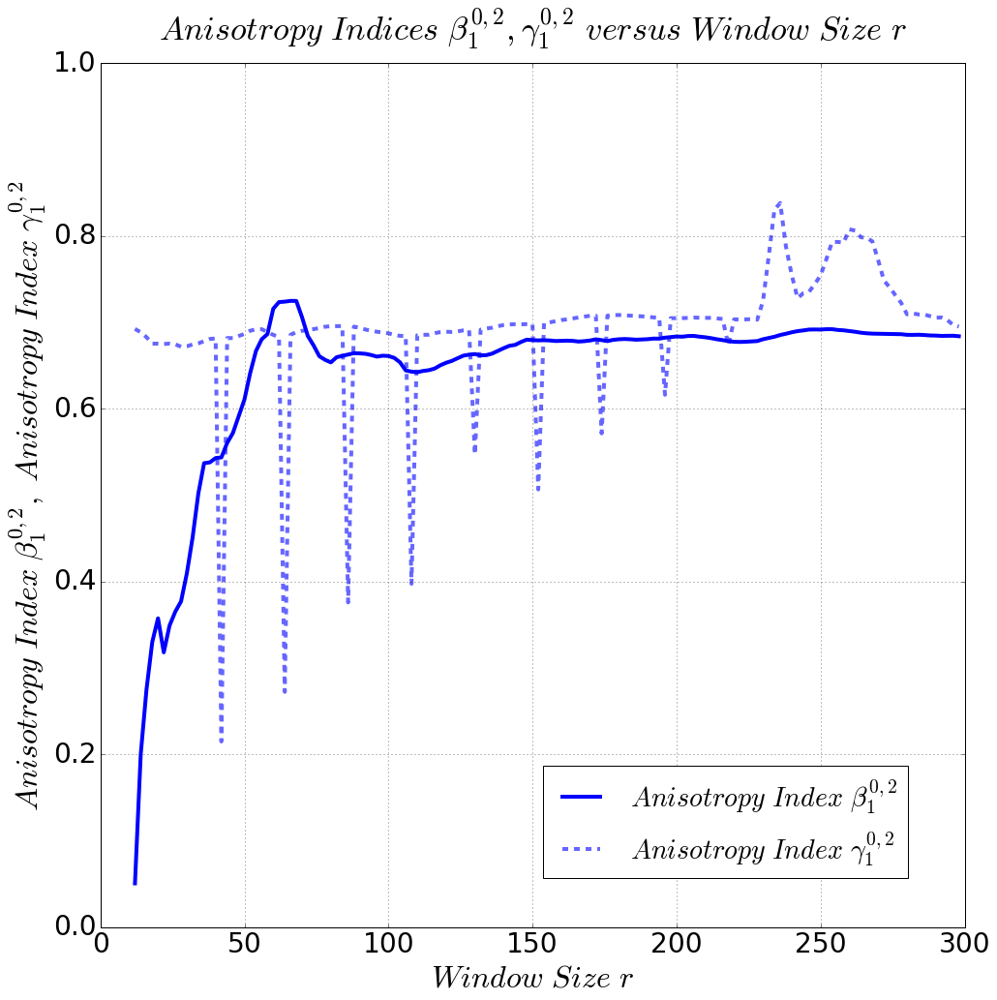

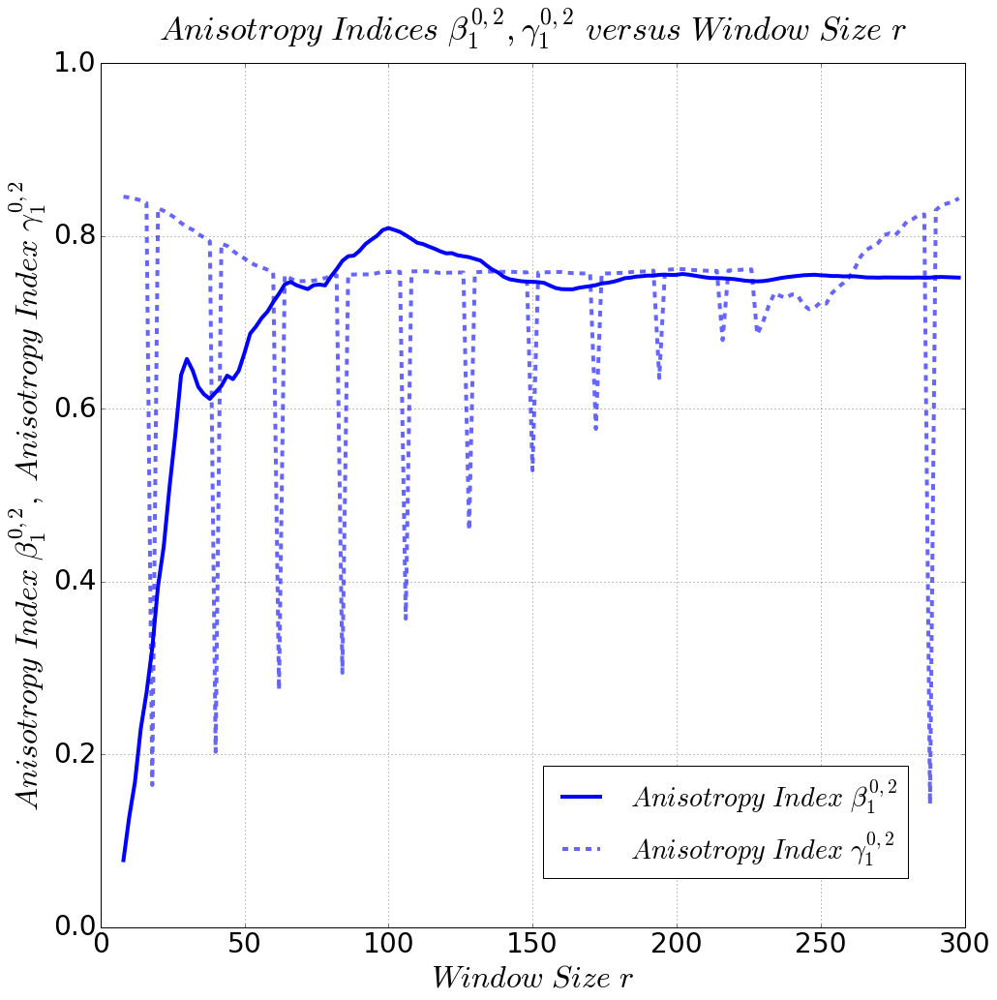

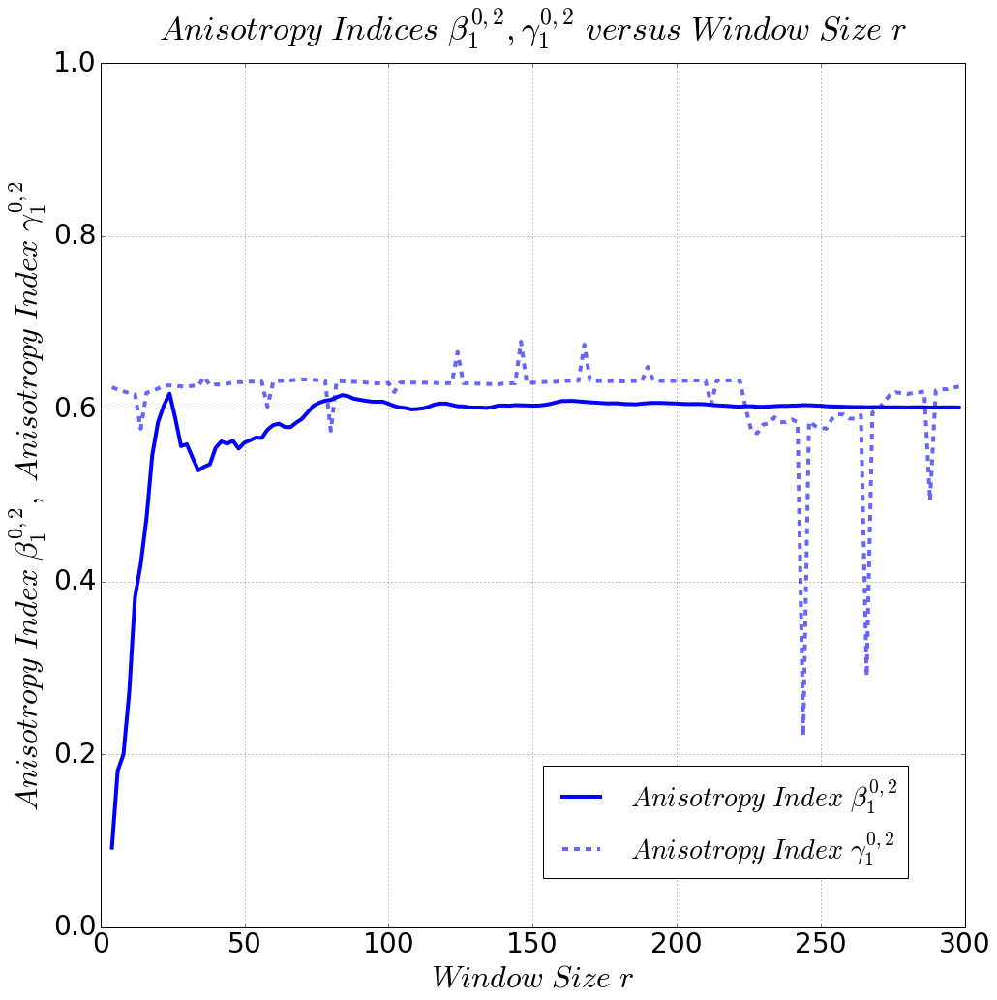

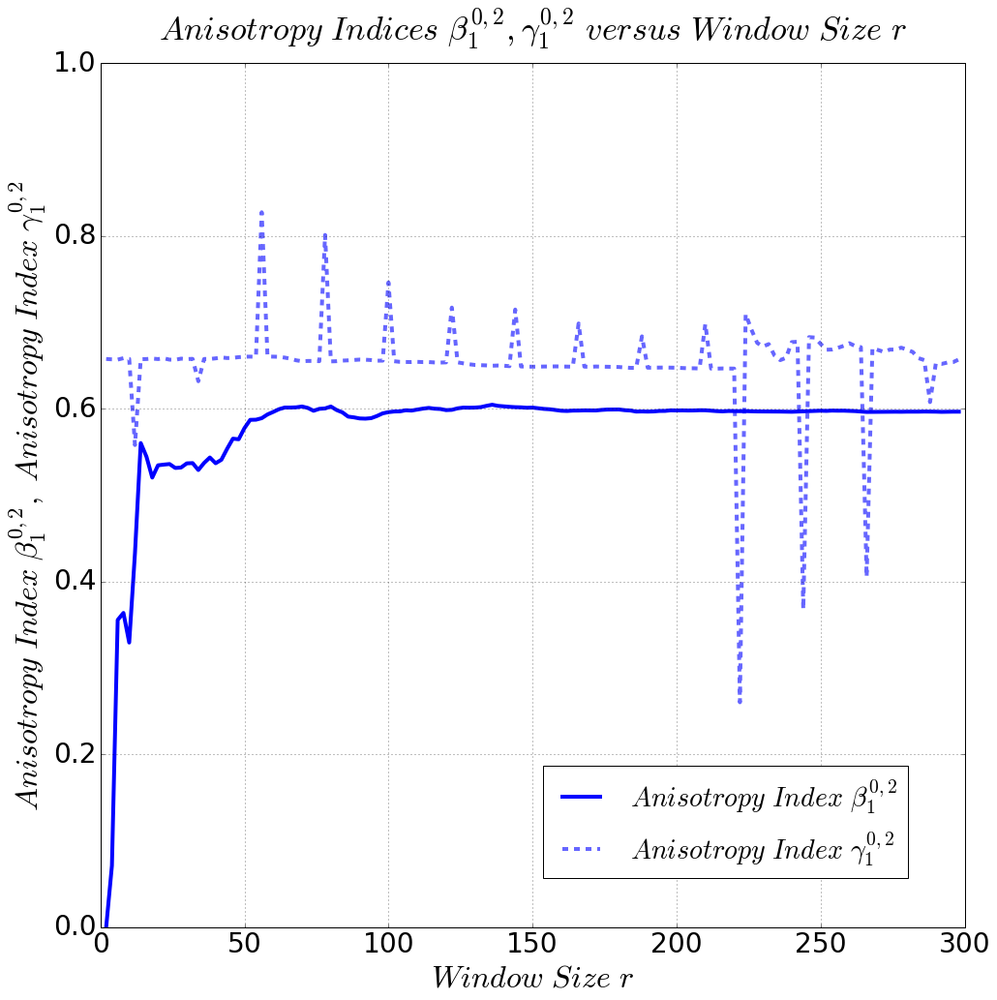

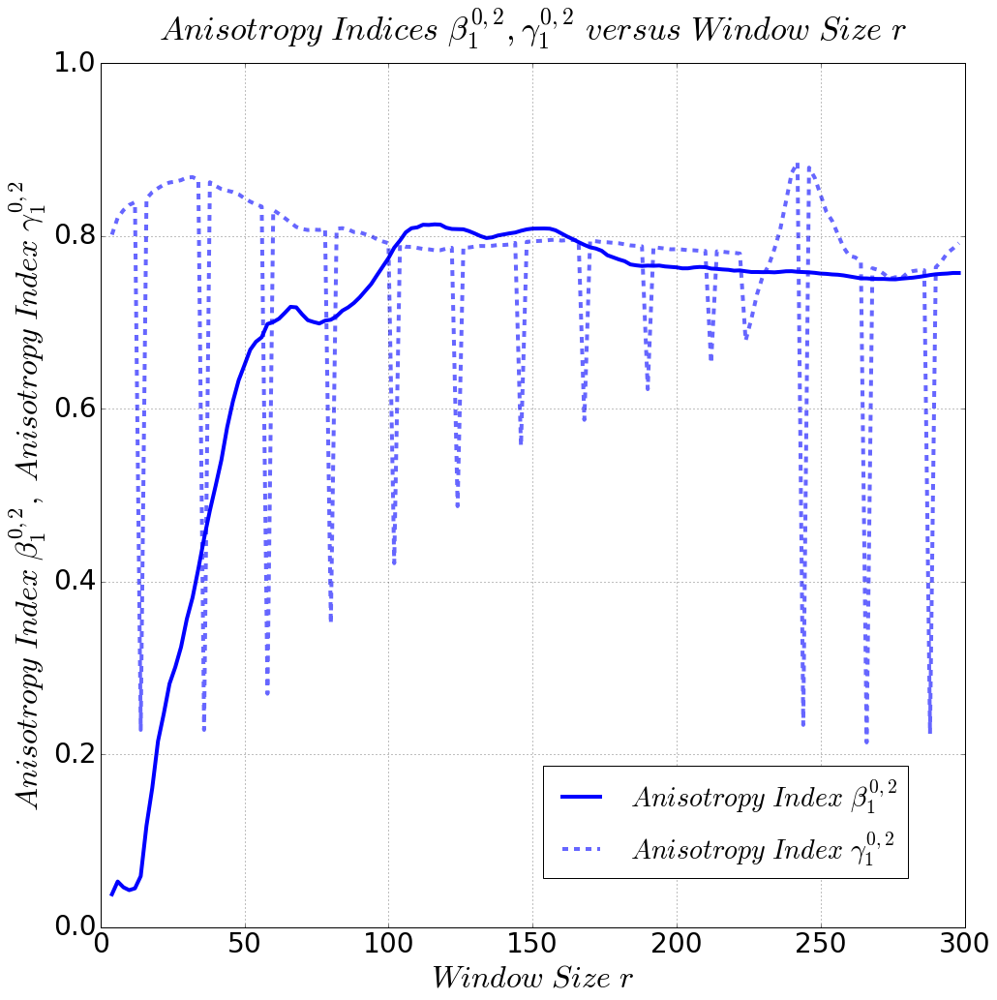

...

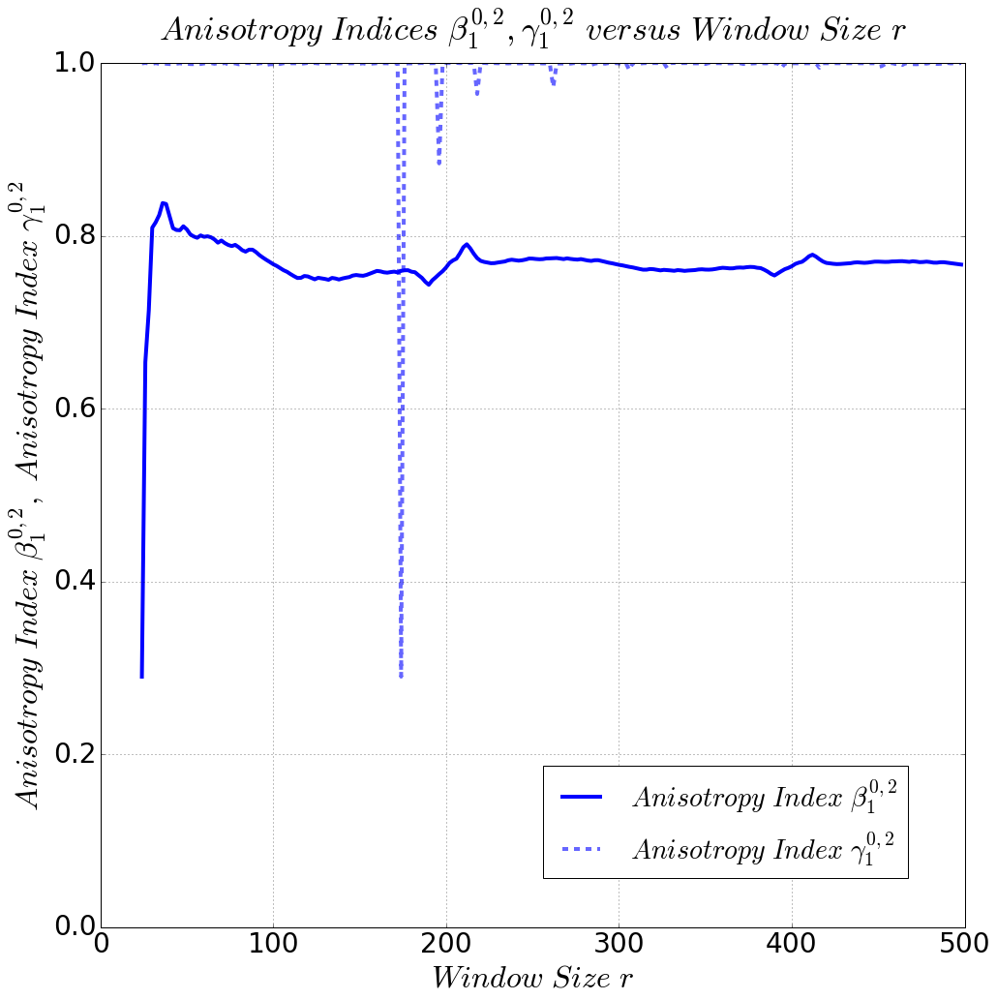

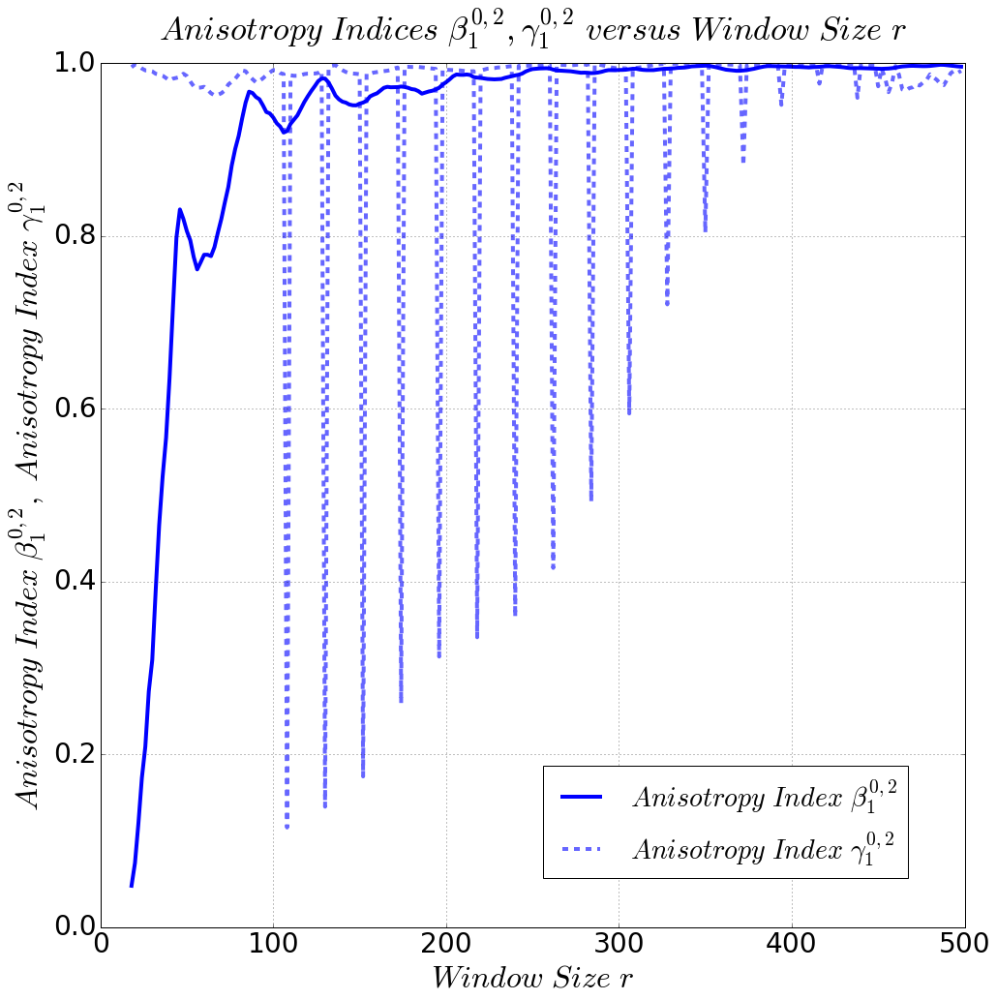

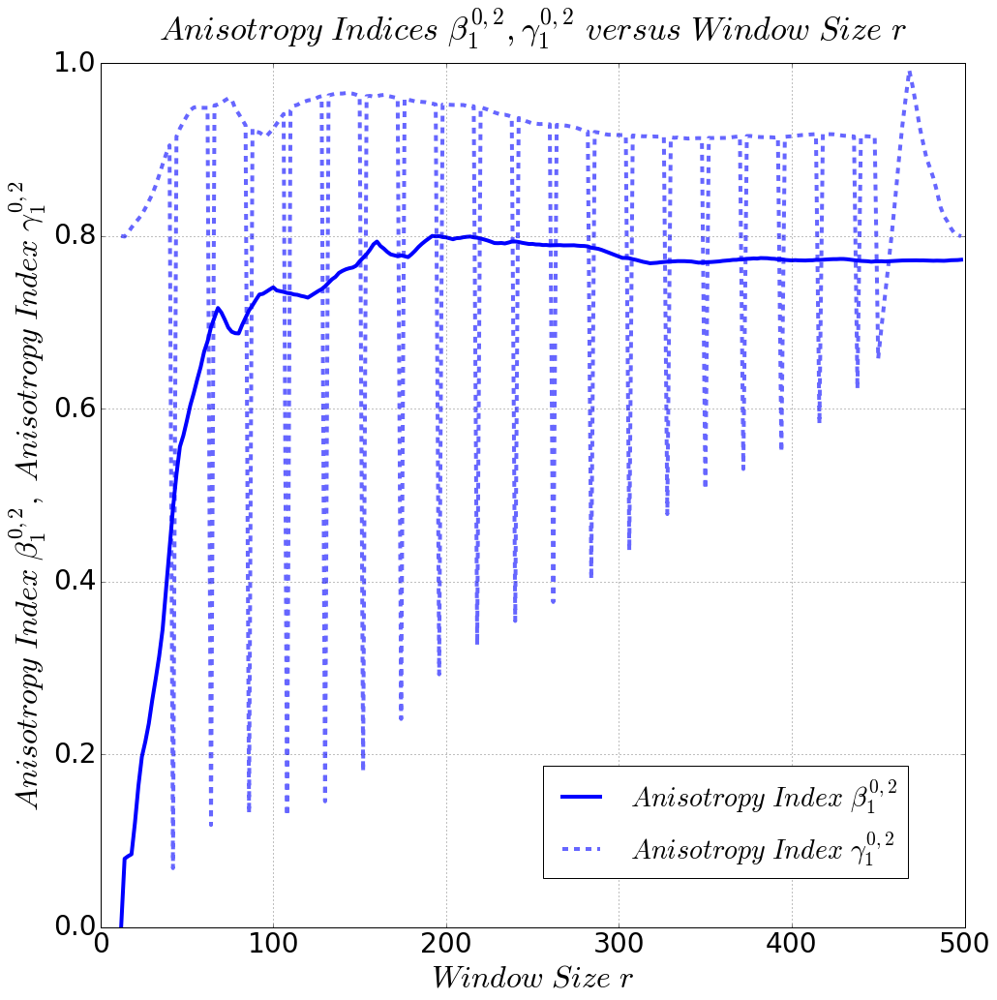

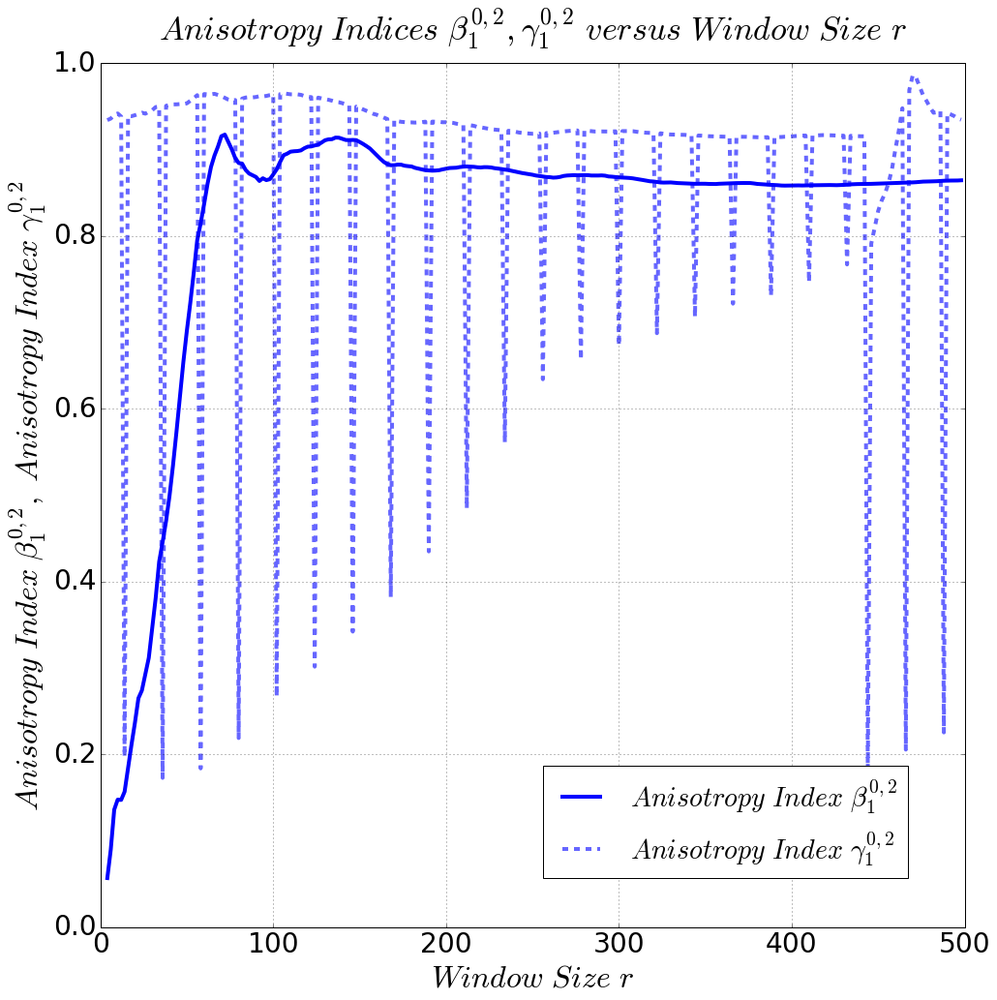

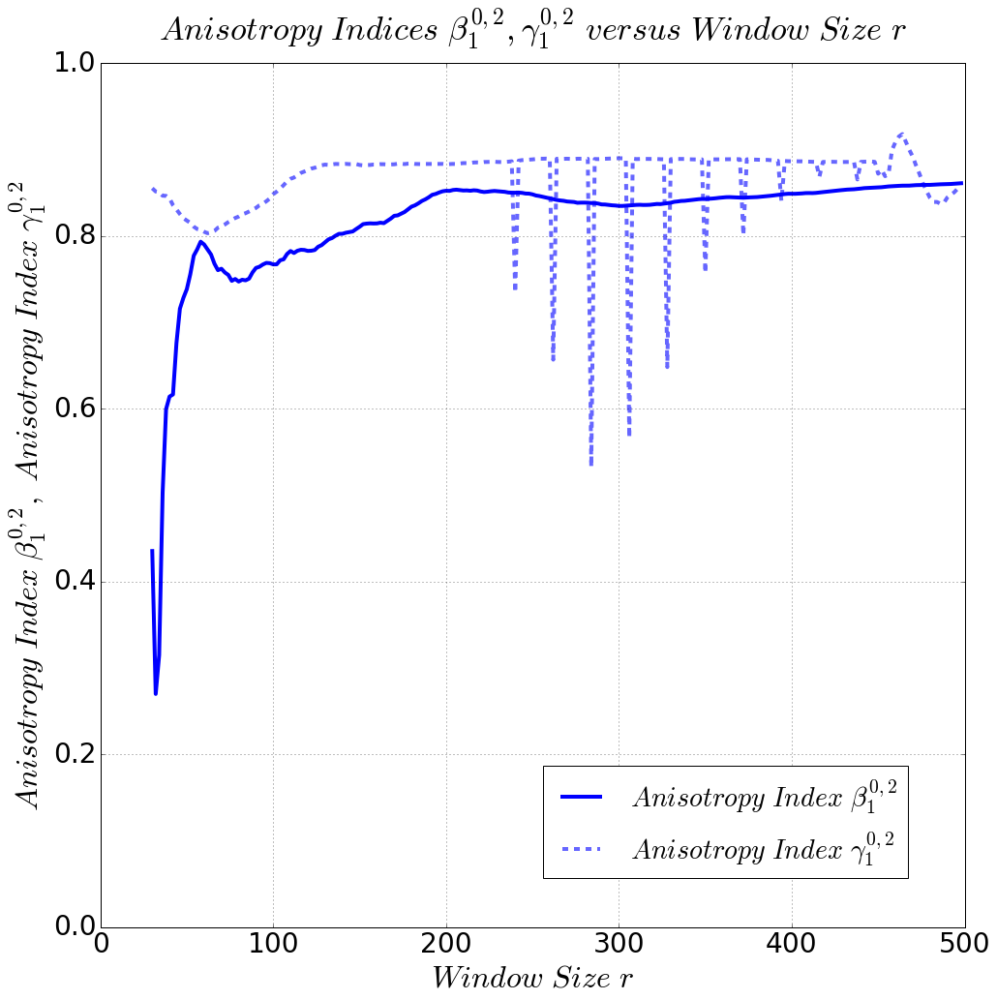

In [7]:
for sample_name in sample_names:
    fig, ax = plt.subplots(figsize=(16,16))
    dx = minkowski_data[sample_name]["dx"]
    beta1 = minkowski_data[sample_name]["beta_102"]
    gamma1 = minkowski_data[sample_name]["gamma_102"]
    

    ax.set_xlim(0, dx[-1]+2)
    ax.set_ylim(0.0, 1.0)

    ax.set_title(r'$Anisotropy \ Indices \ \beta_{1}^{0,2}, \gamma_{1}^{0,2} \ versus \ Window \ Size \ r$', fontsize=title_size, y=1.02)

    ax.set_xlabel(r'$Window \ Size \ r$', fontsize=xLabel_size)
    ax.set_ylabel(r'$Anisotropy \ Index \ \beta_{1}^{0,2}, \ Anisotropy \ Index \ \gamma_{1}^{0,2}$', fontsize=yLabel_size)

    ax.plot(dx, beta1, color="blue", label=r'$Anisotropy \ Index \ \beta_{1}^{0,2}$', alpha=1.0, linestyle="-", linewidth=line_width)
    ax.plot(dx, gamma1, color="blue", label=r'$Anisotropy \ Index \ \gamma_{1}^{0,2}$', alpha=gamma_alpha, linestyle="--",  linewidth=line_width)

    for item in ax.get_xticklabels():
        item.set_fontsize(tick_mark_label_size)
    for item in ax.get_yticklabels():
        item.set_fontsize(tick_mark_label_size)
    
    plt.grid()
    
    legend = plt.legend(bbox_to_anchor=bbox, fontsize=legend_size)
    frame = legend.get_frame()
    frame.set_facecolor('white')
    frame.set_edgecolor('black')
    
    fig.savefig("minkowski_results/minkowski_ball_figures/beta_1_gamma_1_comparison/"+sample_name+"_minkowski_beta1_gamma1.png", bbox_extra_artists=(legend,), bbox_inches='tight', dpi=300)
plt.close()

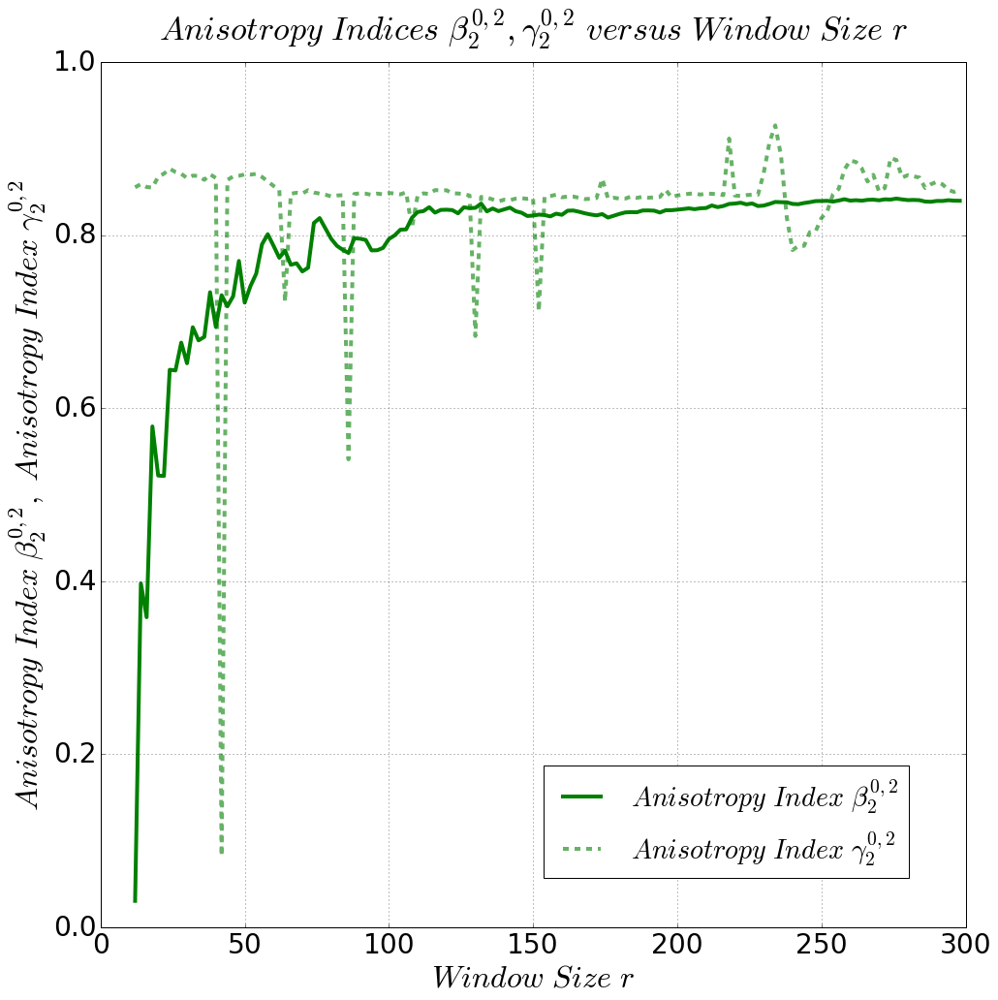

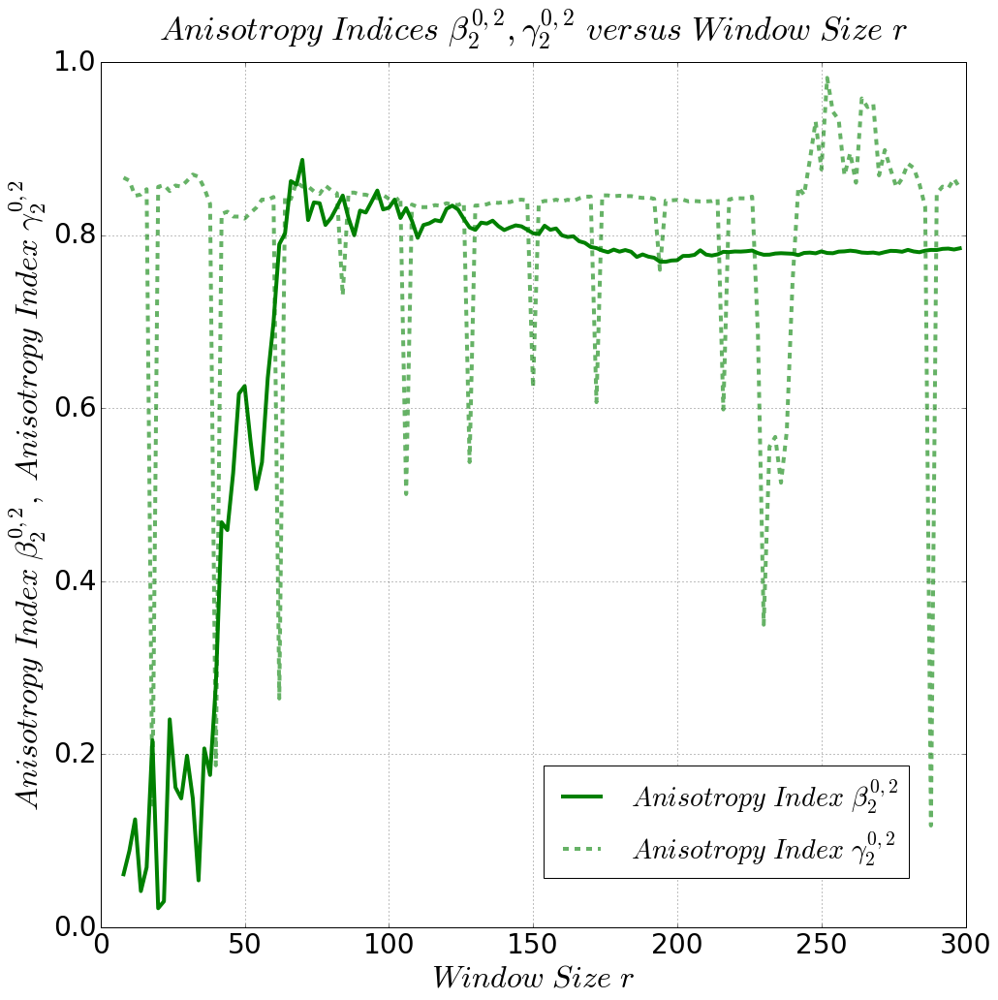

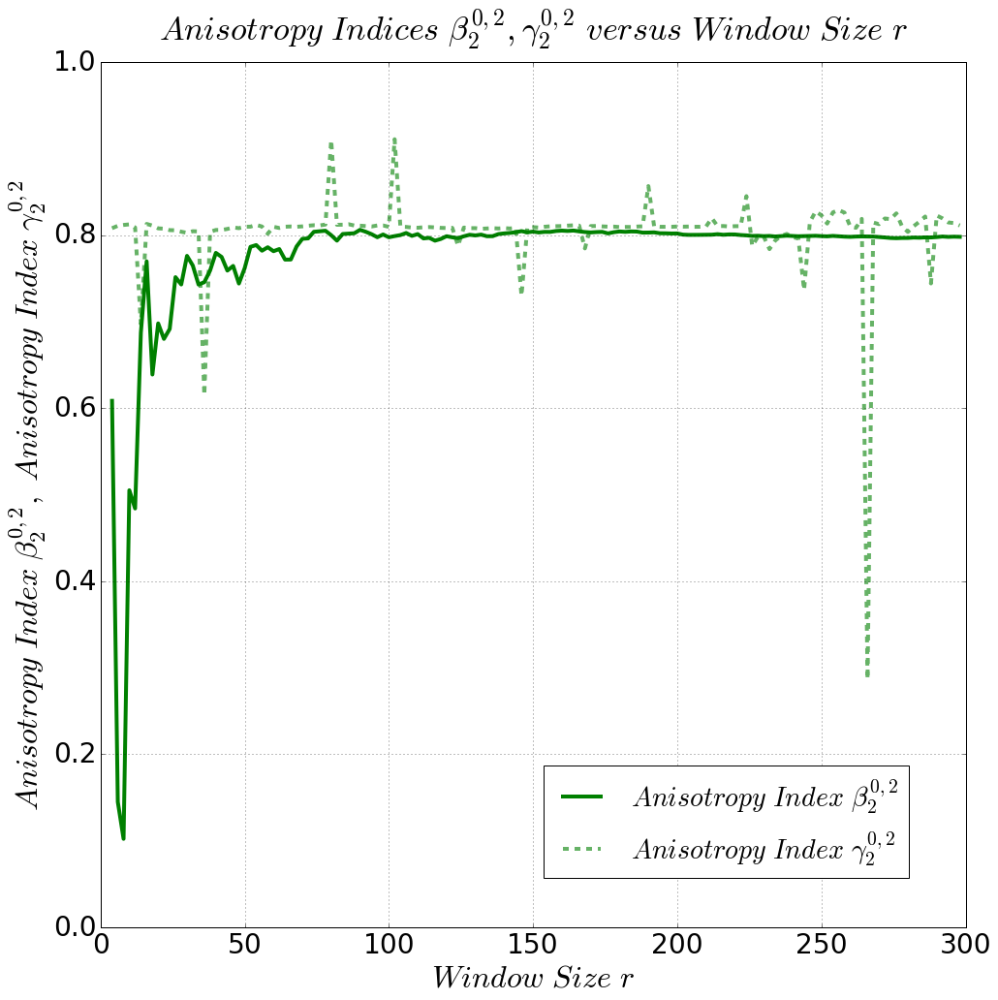

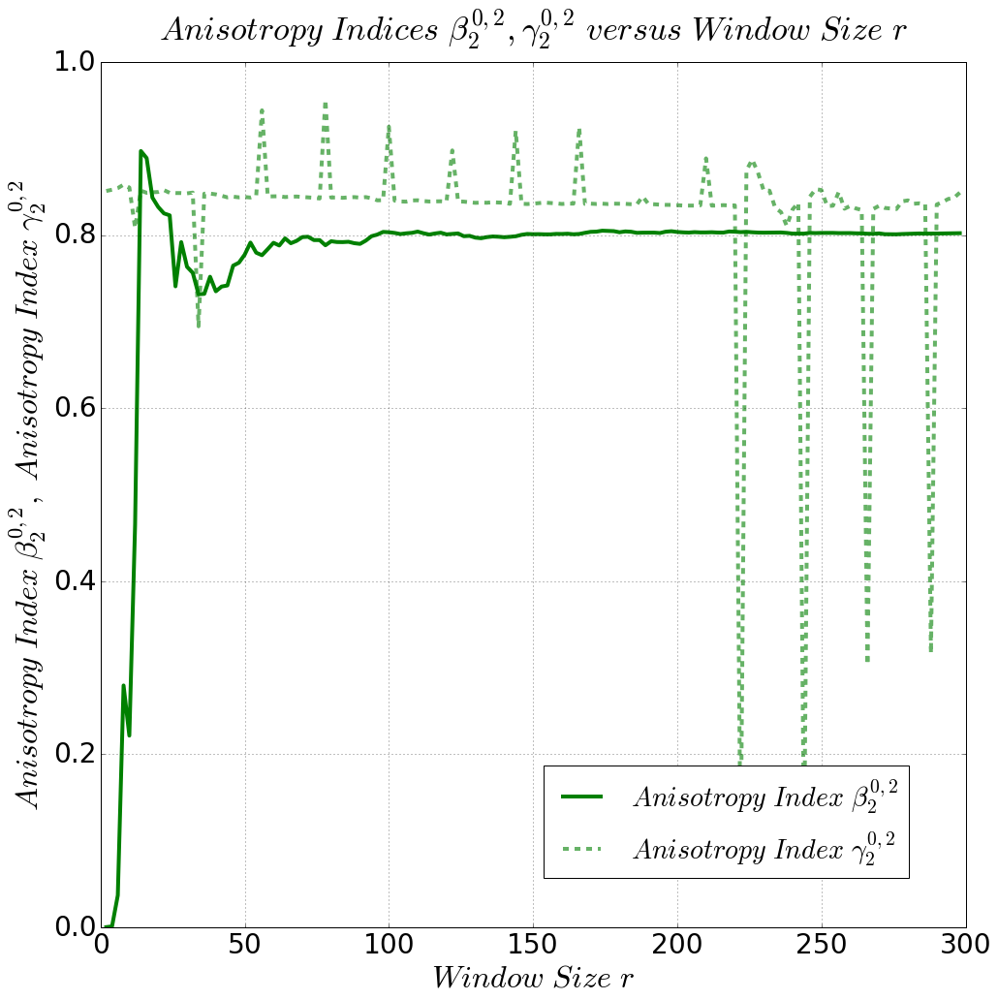

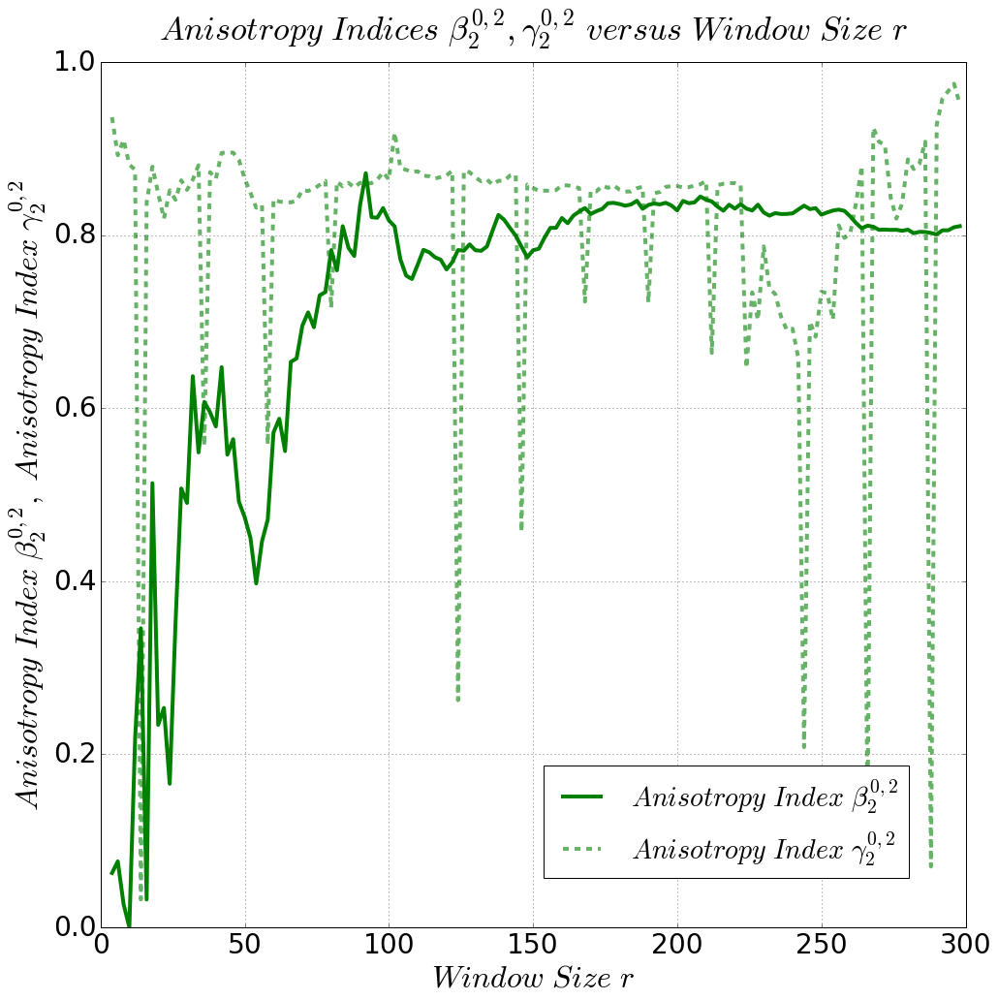

...

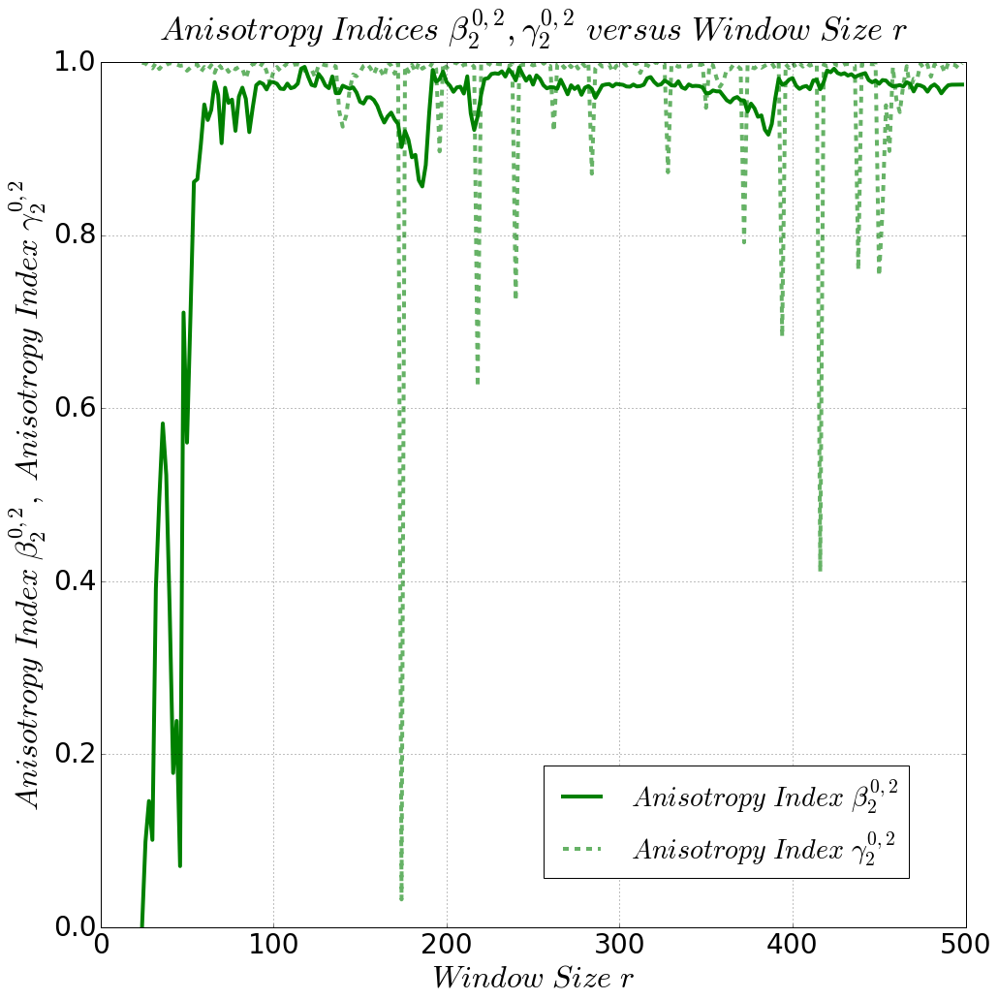

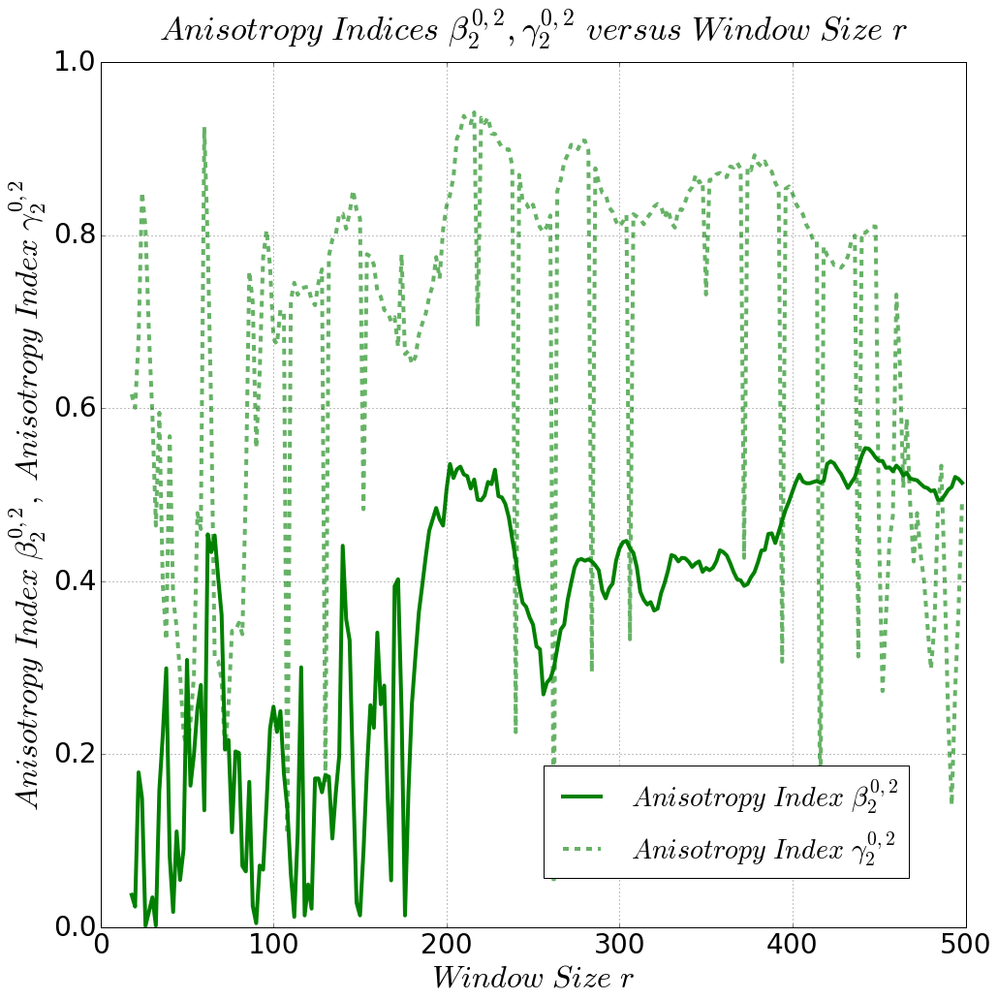

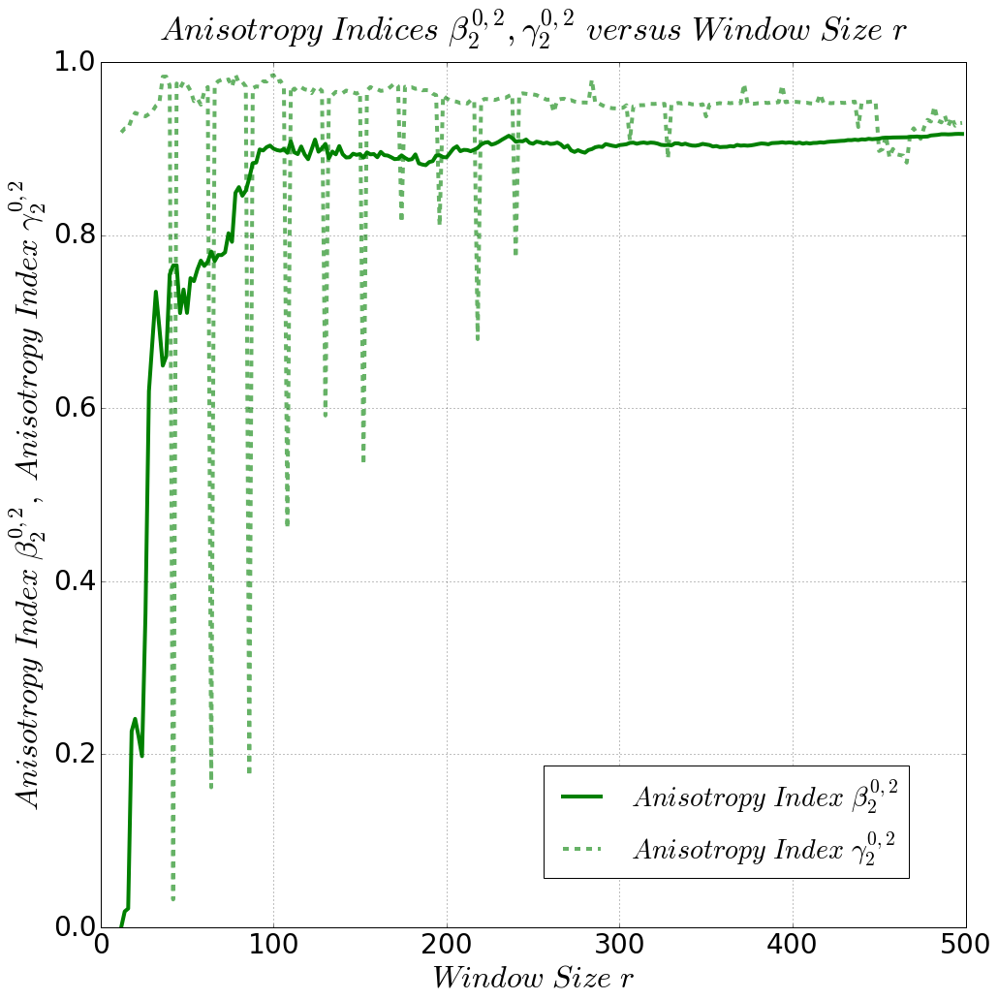

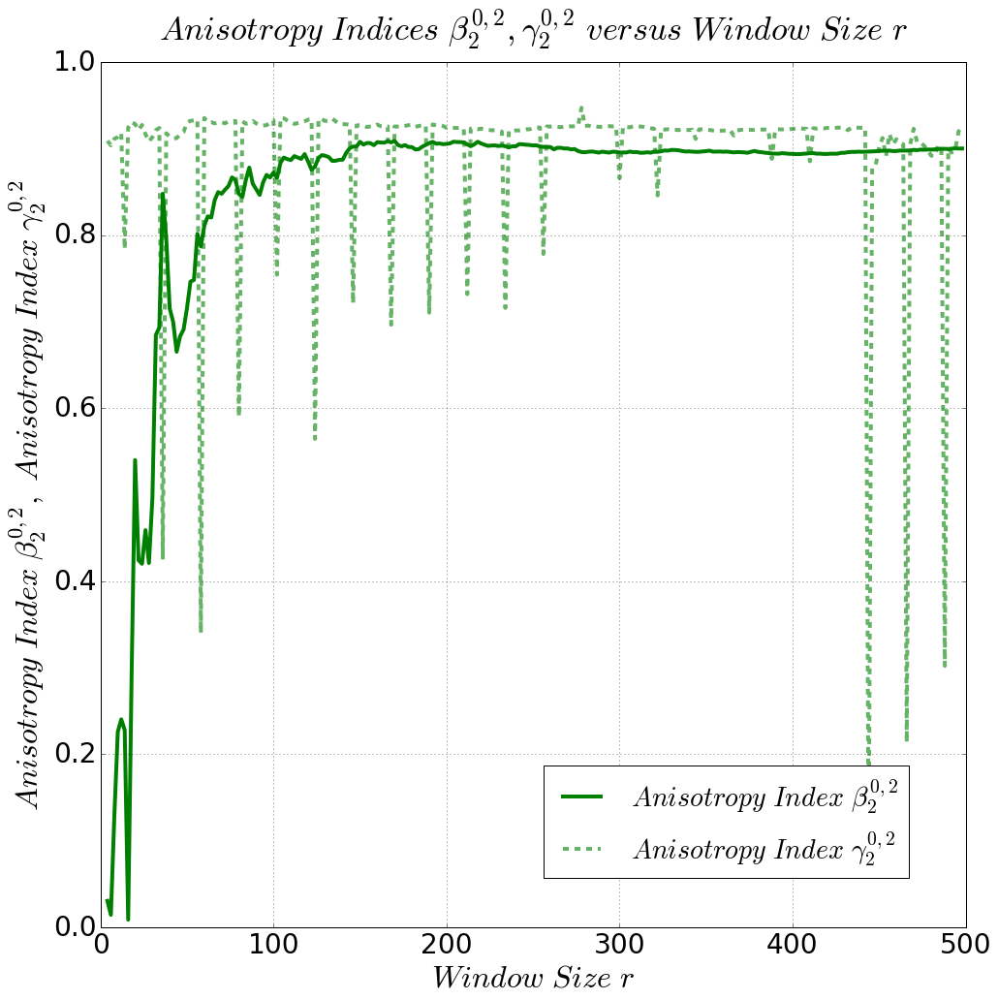

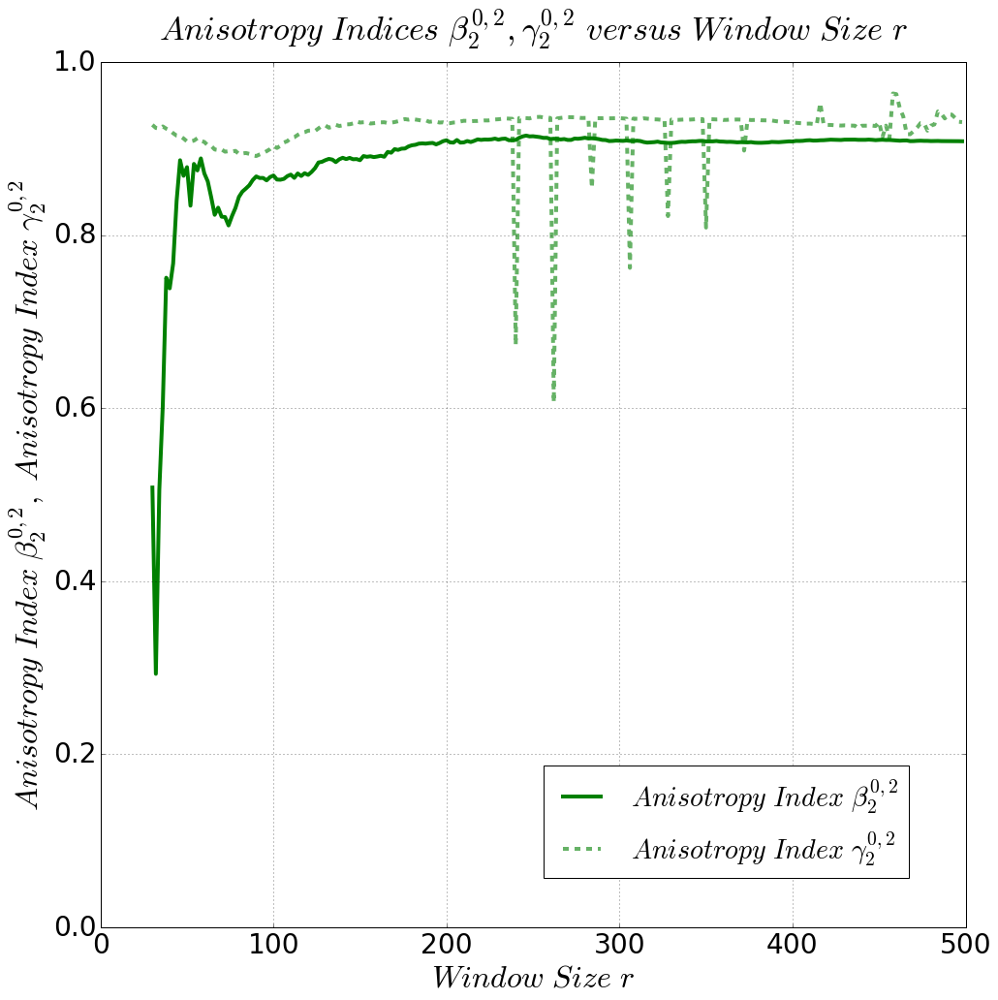

In [8]:
for sample_name in sample_names:
    fig, ax = plt.subplots(figsize=(16,16))
    
    dx = minkowski_data[sample_name]["dx"]
    beta2 = minkowski_data[sample_name]["beta_202"]
    gamma2 = minkowski_data[sample_name]["gamma_202"]
    

    ax.set_xlim(0, dx[-1]+2)
    ax.set_ylim(0.0, 1.0)

    ax.set_title(r'$Anisotropy \ Indices \ \beta_{2}^{0,2}, \gamma_{2}^{0,2} \ versus \ Window \ Size \ r$', fontsize=title_size, y=1.02)

    ax.set_xlabel(r'$Window \ Size \ r$', fontsize=xLabel_size)
    ax.set_ylabel(r'$Anisotropy \ Index \ \beta_{2}^{0,2}, \ Anisotropy \ Index \ \gamma_{2}^{0,2}$', fontsize=yLabel_size)

    ax.plot(dx, beta2, color="green", label=r'$Anisotropy \ Index \ \beta_{2}^{0,2}$', alpha=1.0, linestyle="-", linewidth=line_width)
    ax.plot(dx, gamma2, color="green", label=r'$Anisotropy \ Index \ \gamma_{2}^{0,2}$', alpha=gamma_alpha, linestyle="--",  linewidth=line_width)

    for item in ax.get_xticklabels():
        item.set_fontsize(tick_mark_label_size)
    for item in ax.get_yticklabels():
        item.set_fontsize(tick_mark_label_size)
    
    plt.grid()
    legend = plt.legend(bbox_to_anchor=bbox, fontsize=legend_size)
    frame = legend.get_frame()
    frame.set_facecolor('white')
    frame.set_edgecolor('black')
    
    fig.savefig("minkowski_results/minkowski_ball_figures/beta_2_gamma_2_comparison/"+sample_name+"_minkowski_beta2_gamma2.png", bbox_extra_artists=(legend,), bbox_inches='tight', dpi=300)
plt.close()

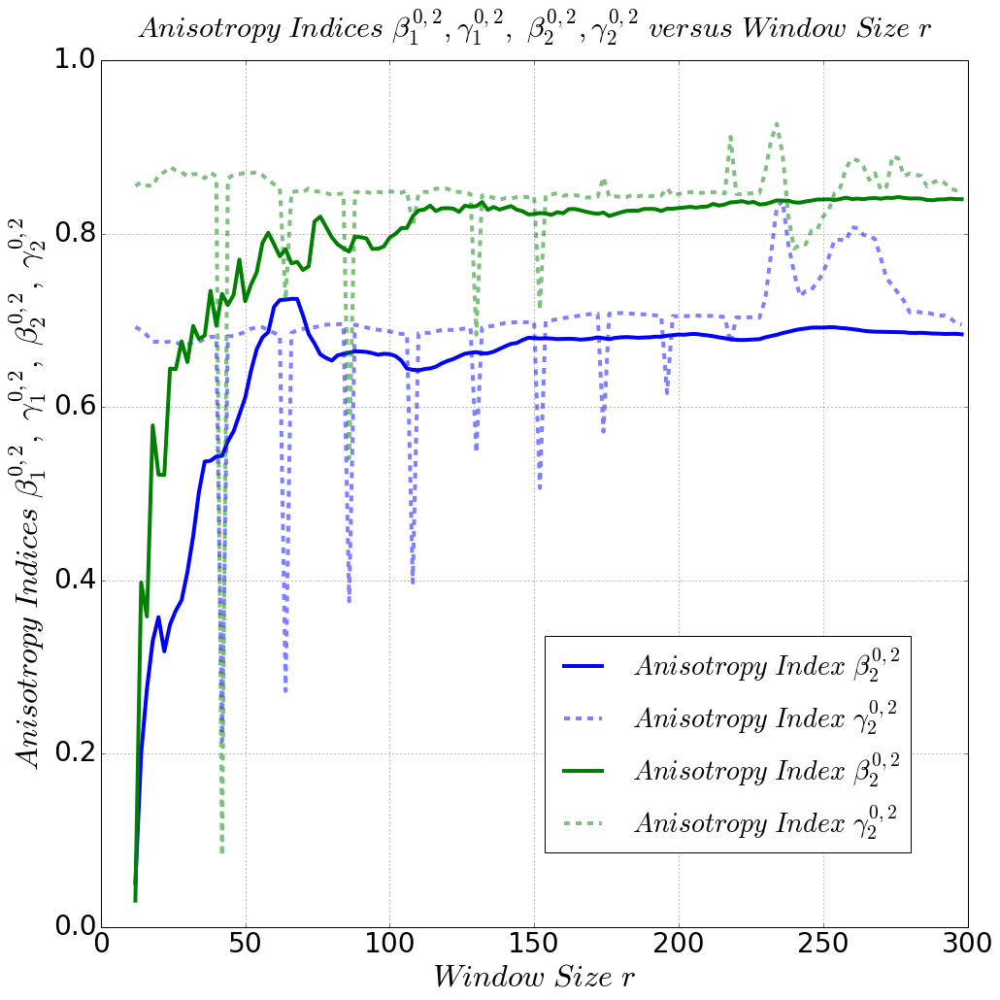

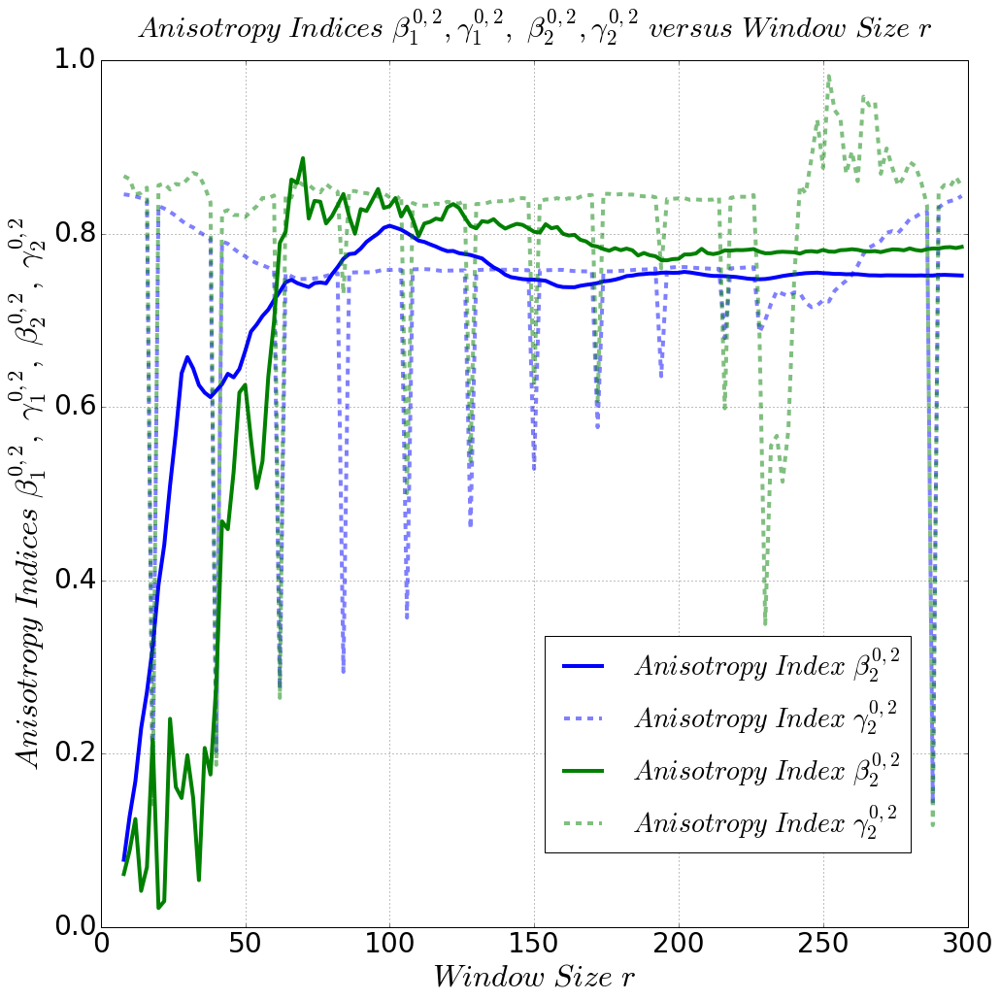

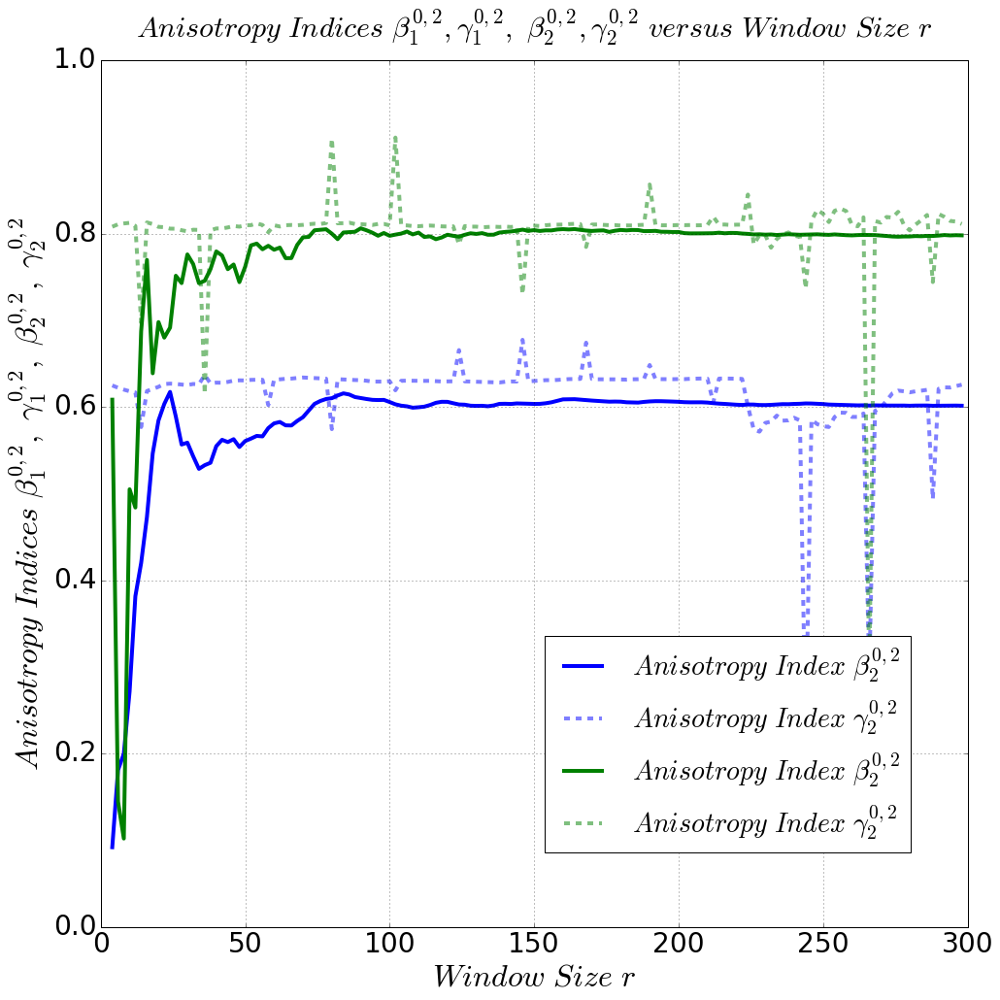

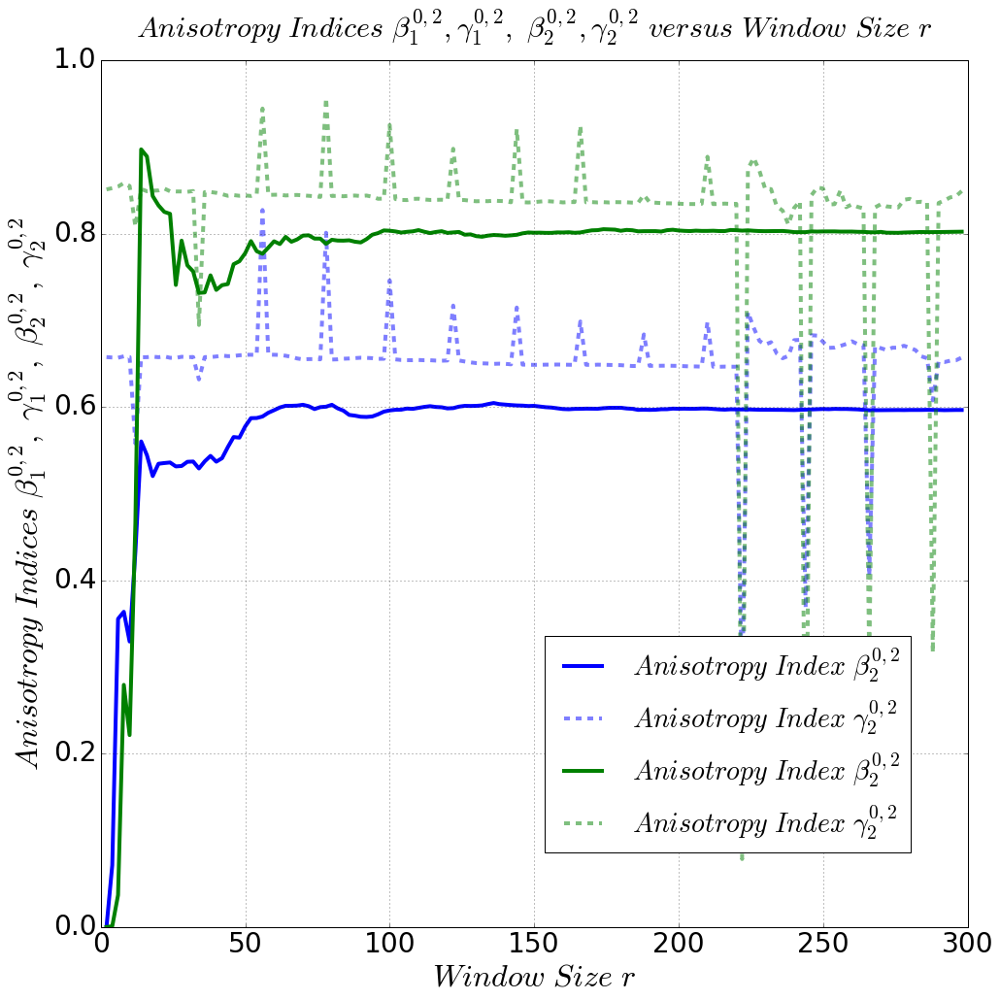

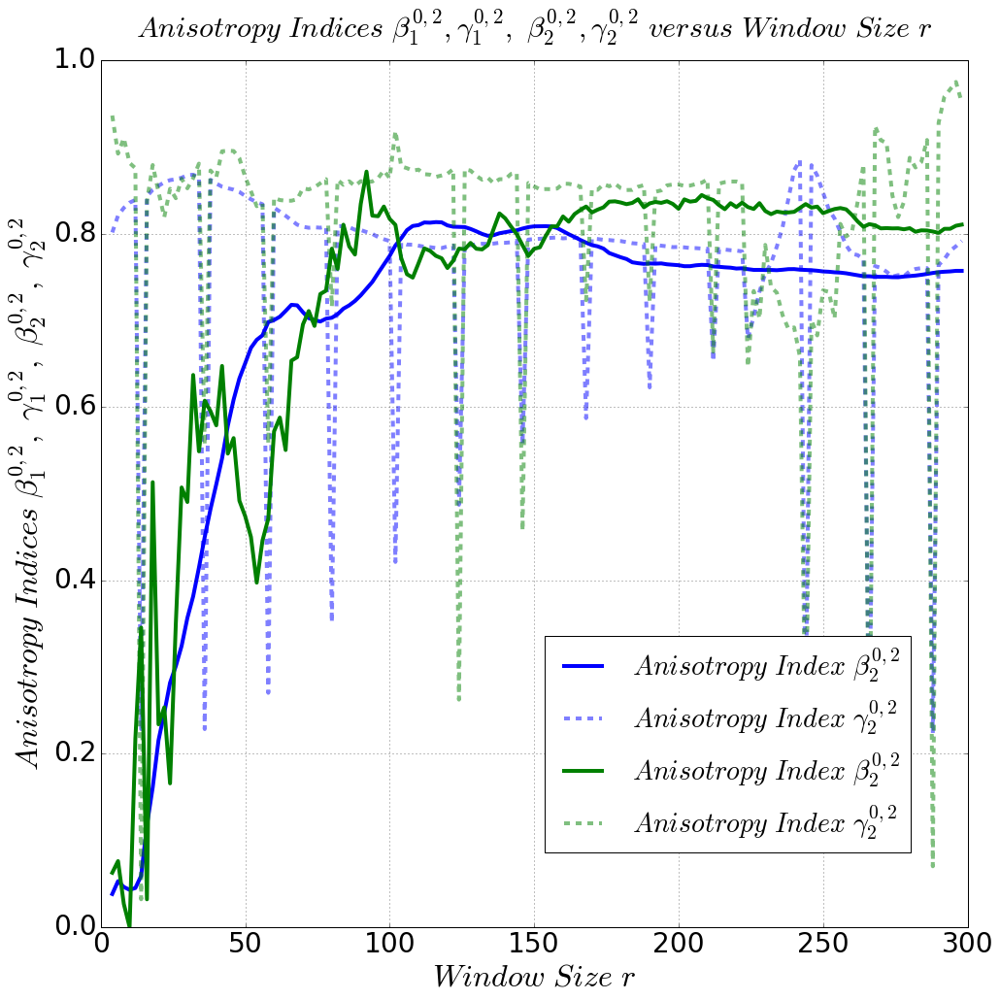

...

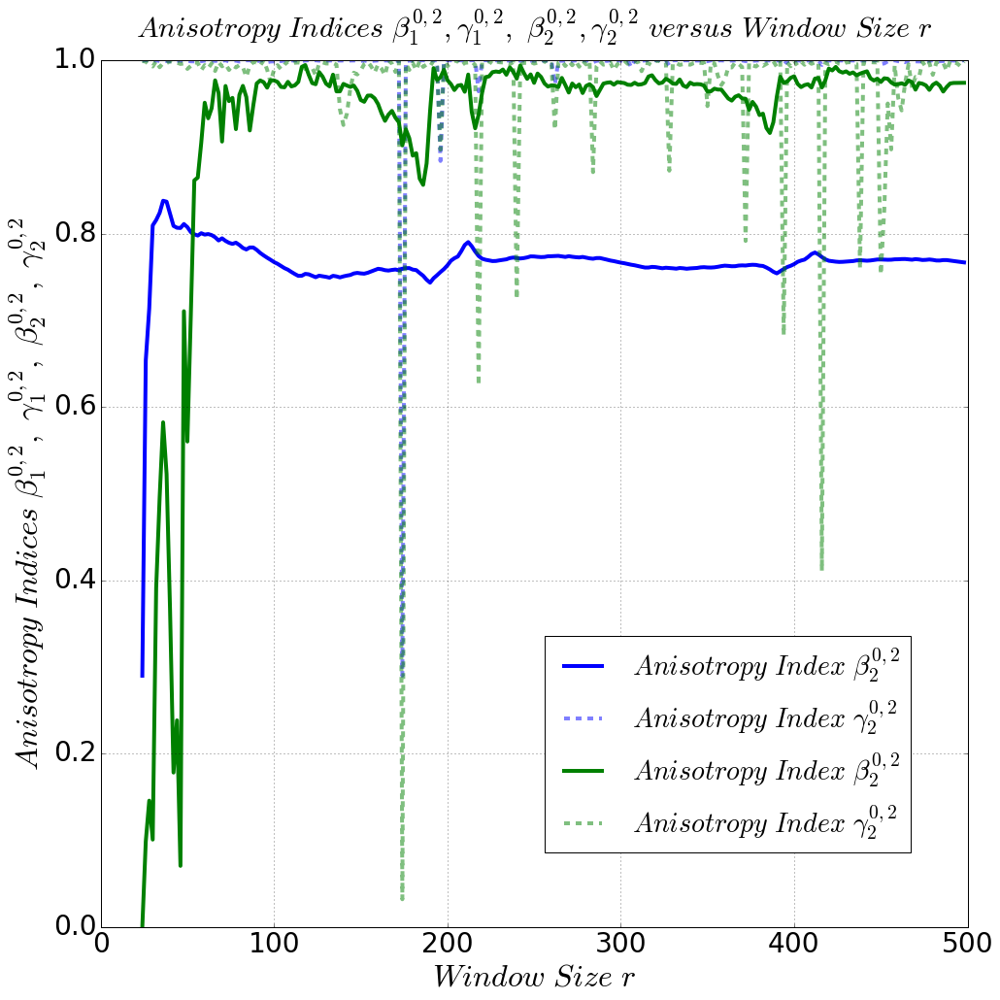

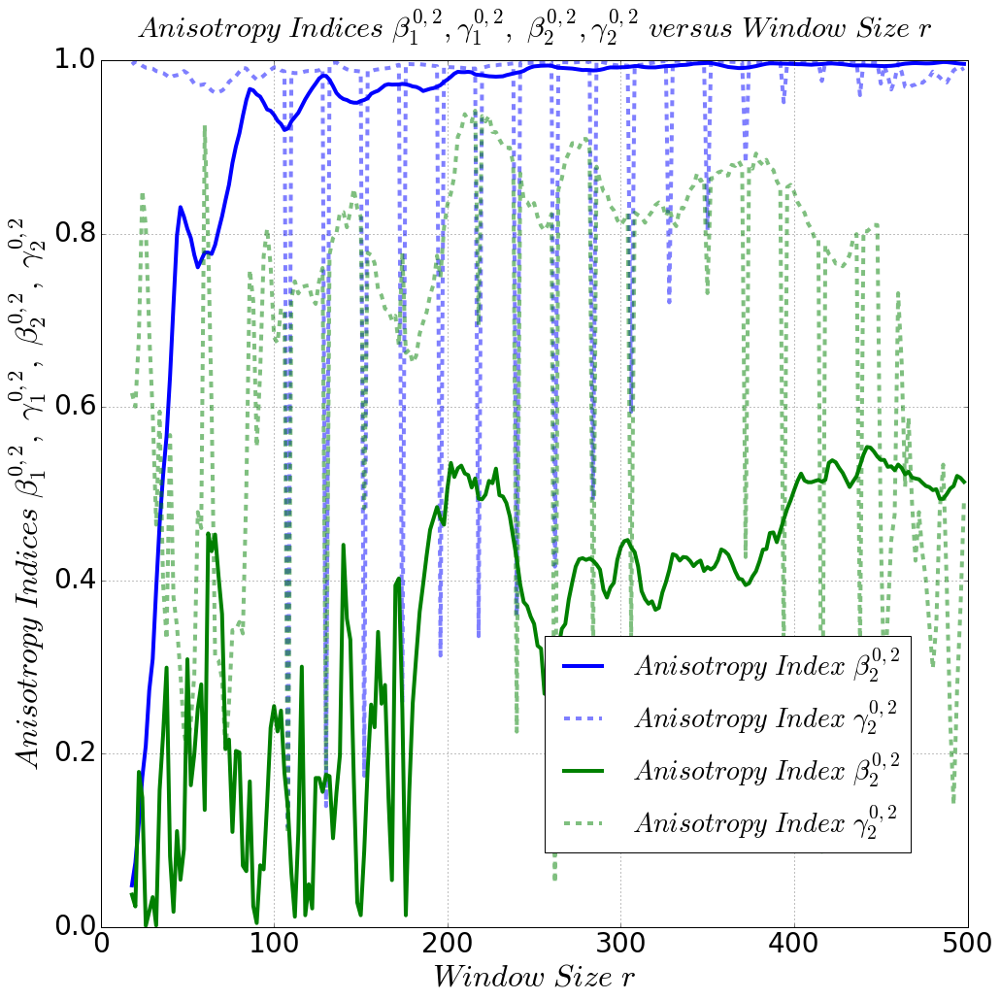

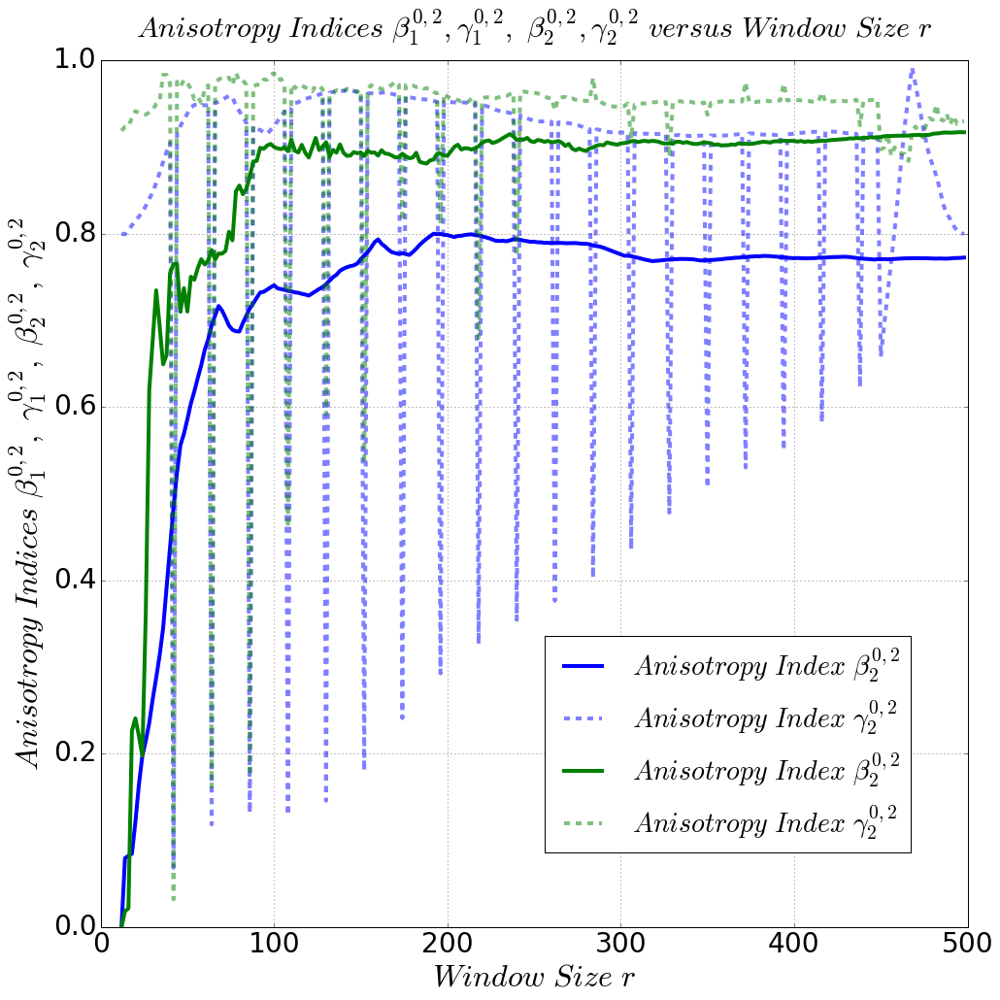

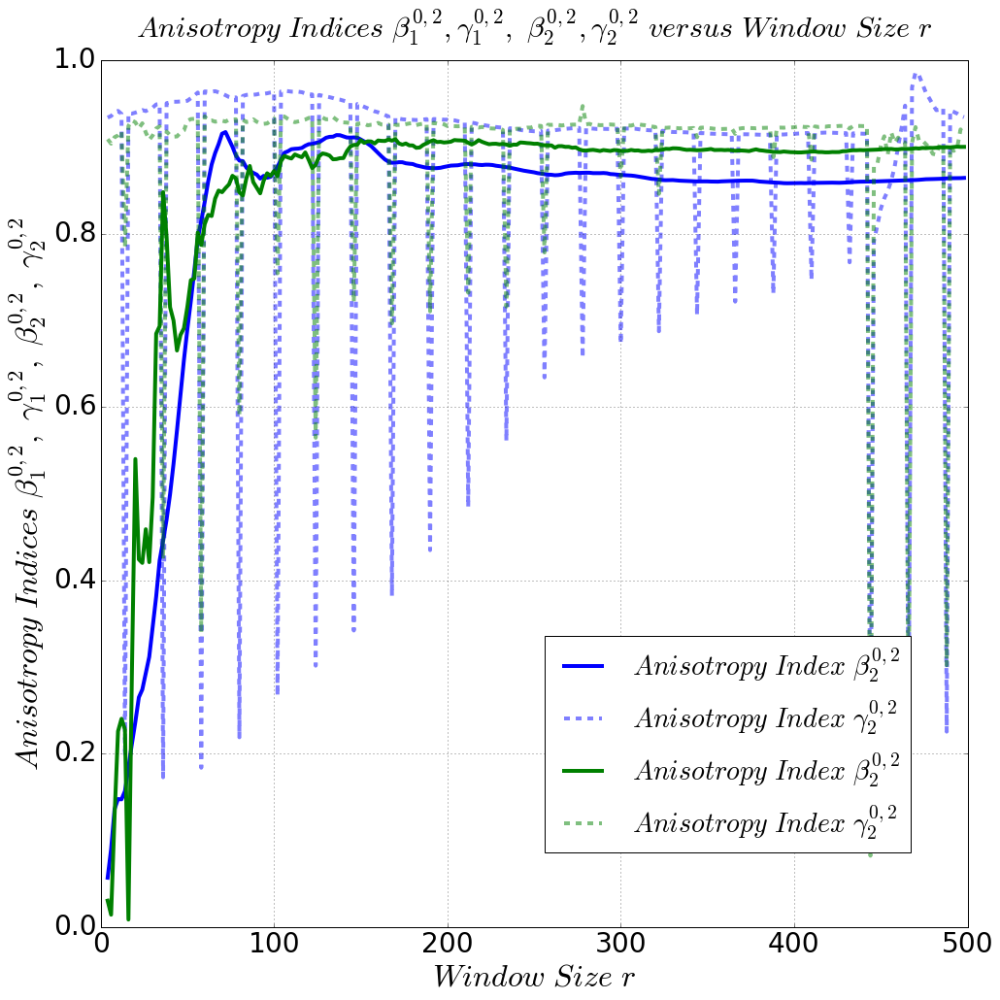

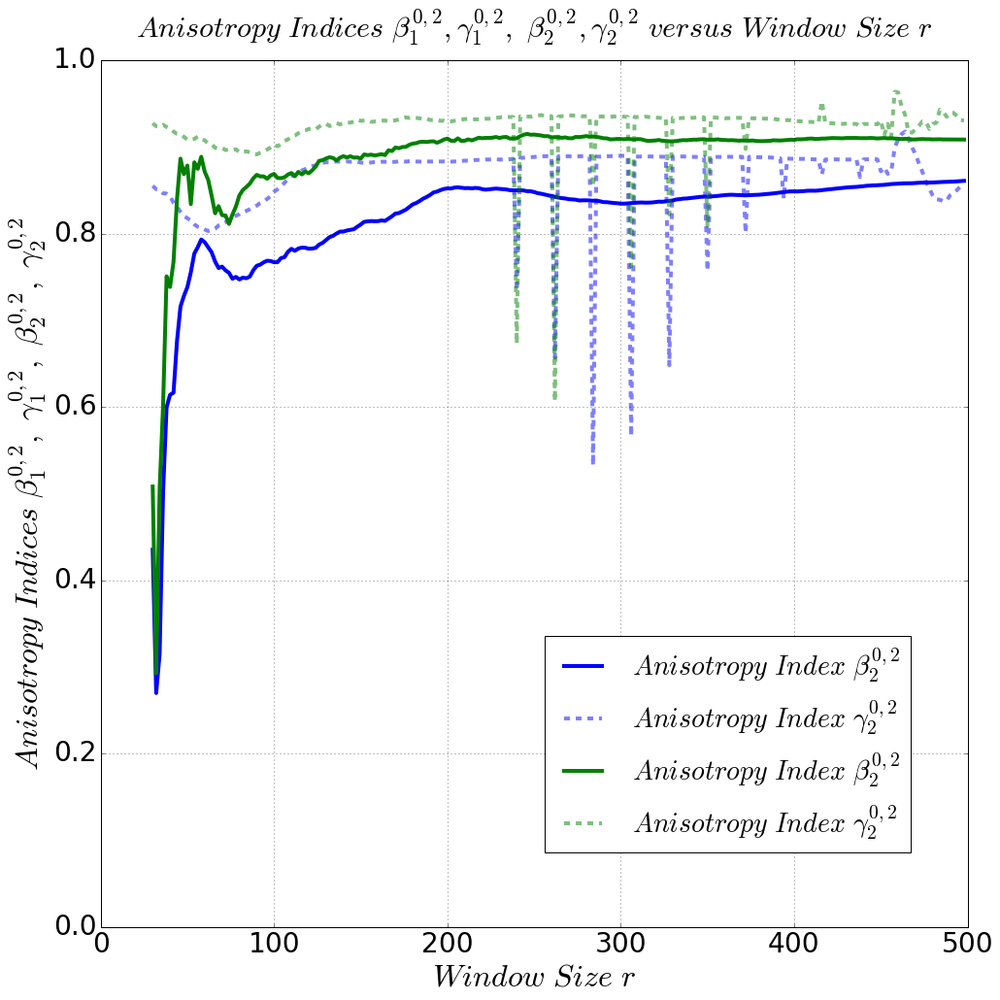

In [9]:
for sample_name in sample_names:
    fig, ax = plt.subplots(figsize=(16,16))
    
    dx = minkowski_data[sample_name]["dx"]
    beta1 = minkowski_data[sample_name]["beta_102"]
    gamma1 = minkowski_data[sample_name]["gamma_102"]
    beta2 = minkowski_data[sample_name]["beta_202"]
    gamma2 = minkowski_data[sample_name]["gamma_202"]

    ax.set_xlim(0, dx[-1]+2)
    ax.set_ylim(0.0, 1.0)

    ax.set_title(r'$Anisotropy \ Indices \ \beta_{1}^{0,2}, \gamma_{1}^{0,2}, \ \beta_{2}^{0,2}, \gamma_{2}^{0,2} \ versus \ Window \ Size \ r$', fontsize=title_size-4, y=1.02)

    ax.set_xlabel(r'$Window \ Size \ r$', fontsize=xLabel_size)
    ax.set_ylabel(r'$Anisotropy \ Indices \ \beta_{1}^{0,2}, \ \gamma_{1}^{0,2},  \ \beta_{2}^{0,2}, \ \gamma_{2}^{0,2}$', fontsize=yLabel_size)

    ax.plot(dx, beta1, color="blue", label=r'$Anisotropy \ Index \ \beta_{2}^{0,2}$', alpha=1.0, linestyle="-", linewidth=line_width)
    ax.plot(dx, gamma1, color="blue", label=r'$Anisotropy \ Index \ \gamma_{2}^{0,2}$', alpha=0.5,linestyle="--",  linewidth=line_width)
    ax.plot(dx, beta2, color="green", label=r'$Anisotropy \ Index \ \beta_{2}^{0,2}$', alpha=1.0, linestyle="-", linewidth=line_width)
    ax.plot(dx, gamma2, color="green", label=r'$Anisotropy \ Index \ \gamma_{2}^{0,2}$', alpha=0.5, linestyle="--",  linewidth=line_width)

    
    for item in ax.get_xticklabels():
        item.set_fontsize(tick_mark_label_size)
    for item in ax.get_yticklabels():
        item.set_fontsize(tick_mark_label_size)
    
    plt.grid()
    legend = plt.legend(bbox_to_anchor=bbox_comp, fontsize=legend_size)
    frame = legend.get_frame()
    frame.set_facecolor('white')
    frame.set_edgecolor('black')
    
    fig.savefig("minkowski_results/minkowski_ball_figures/all_comparison/"+sample_name+"_minkowski_comparison.png", bbox_extra_artists=(legend,), bbox_inches='tight', dpi=300)
plt.close()

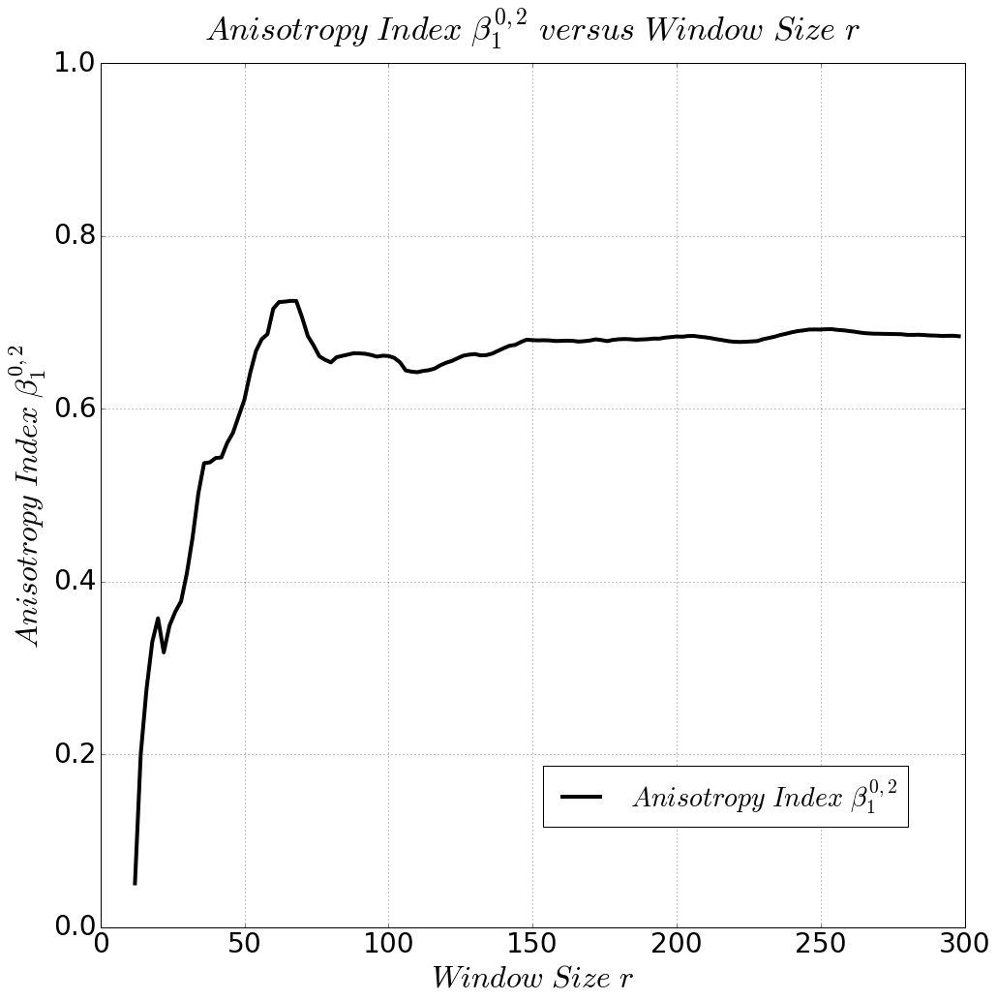

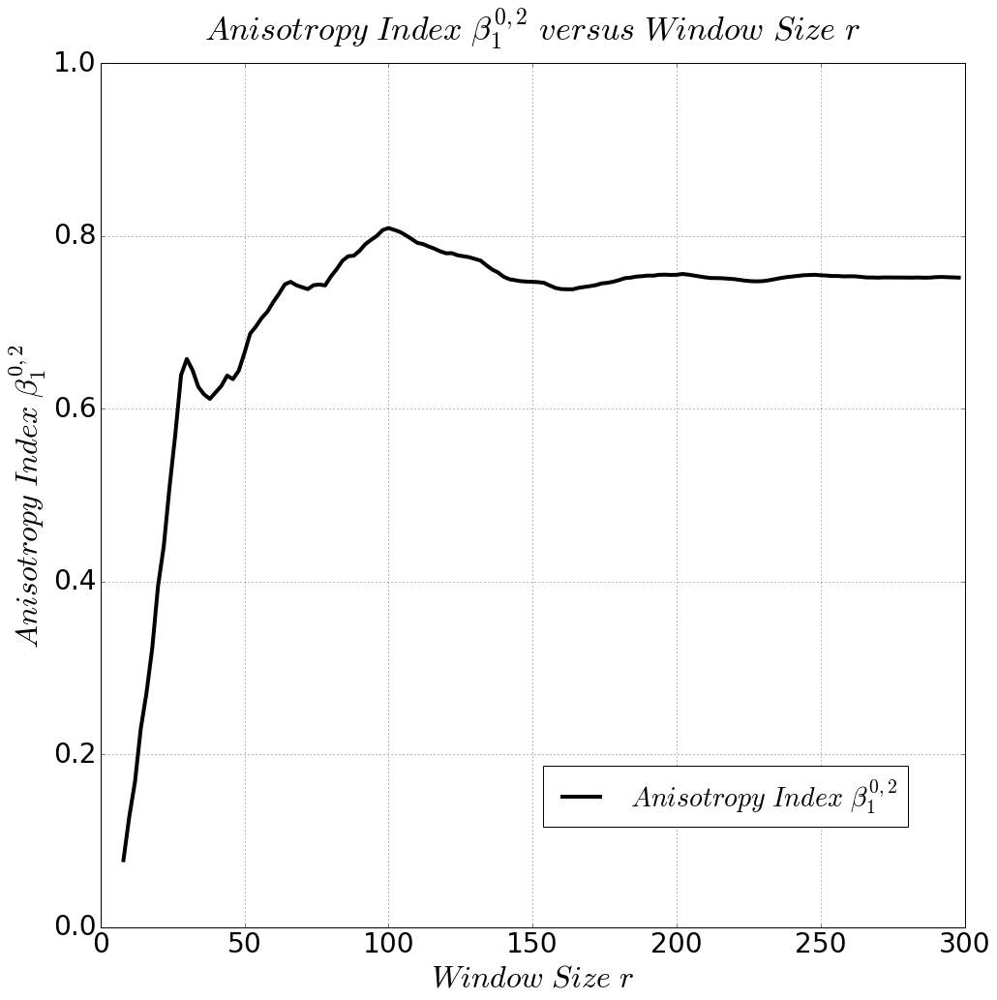

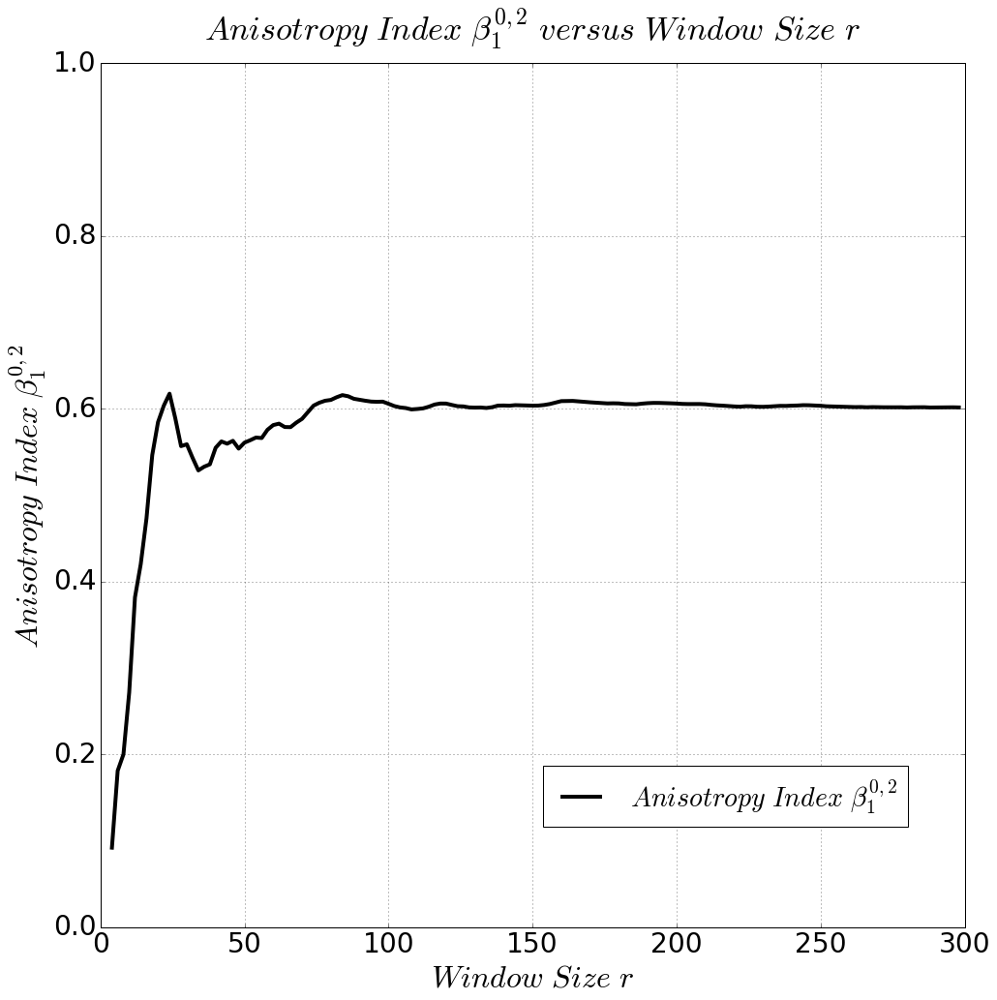

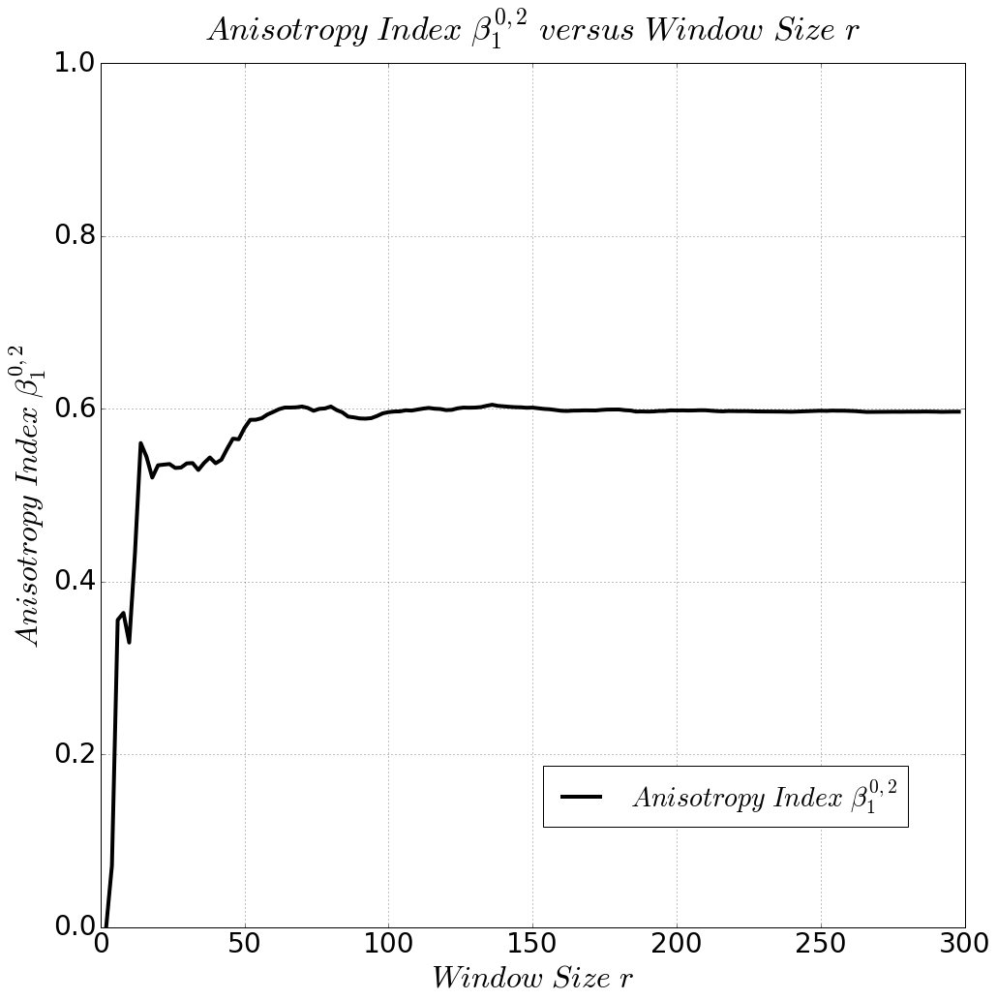

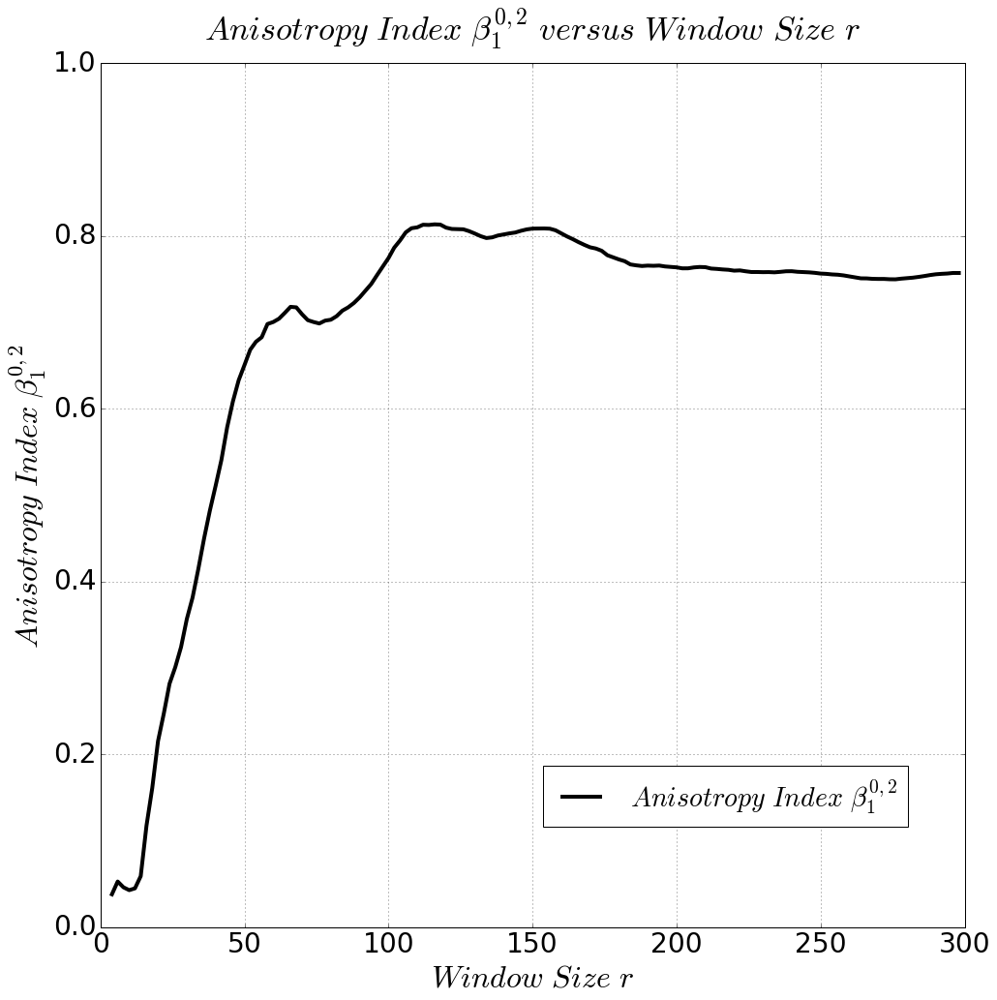

...

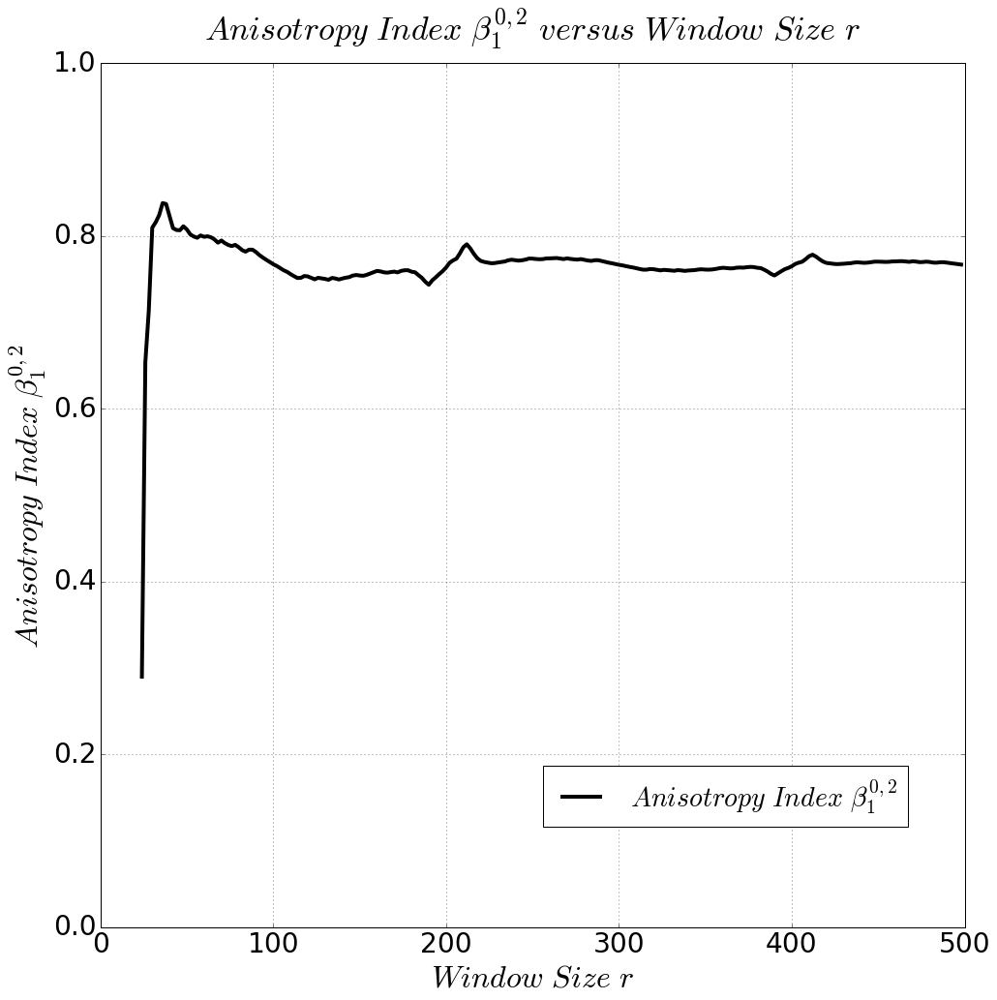

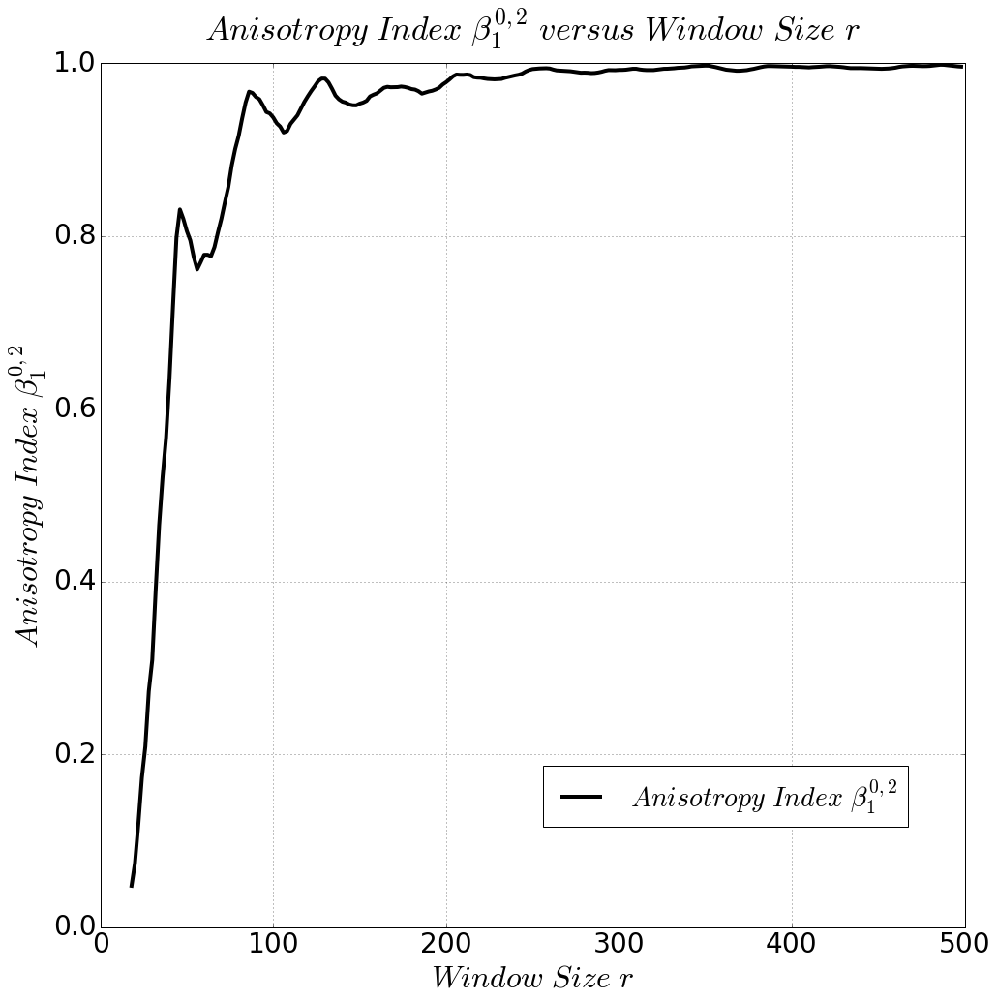

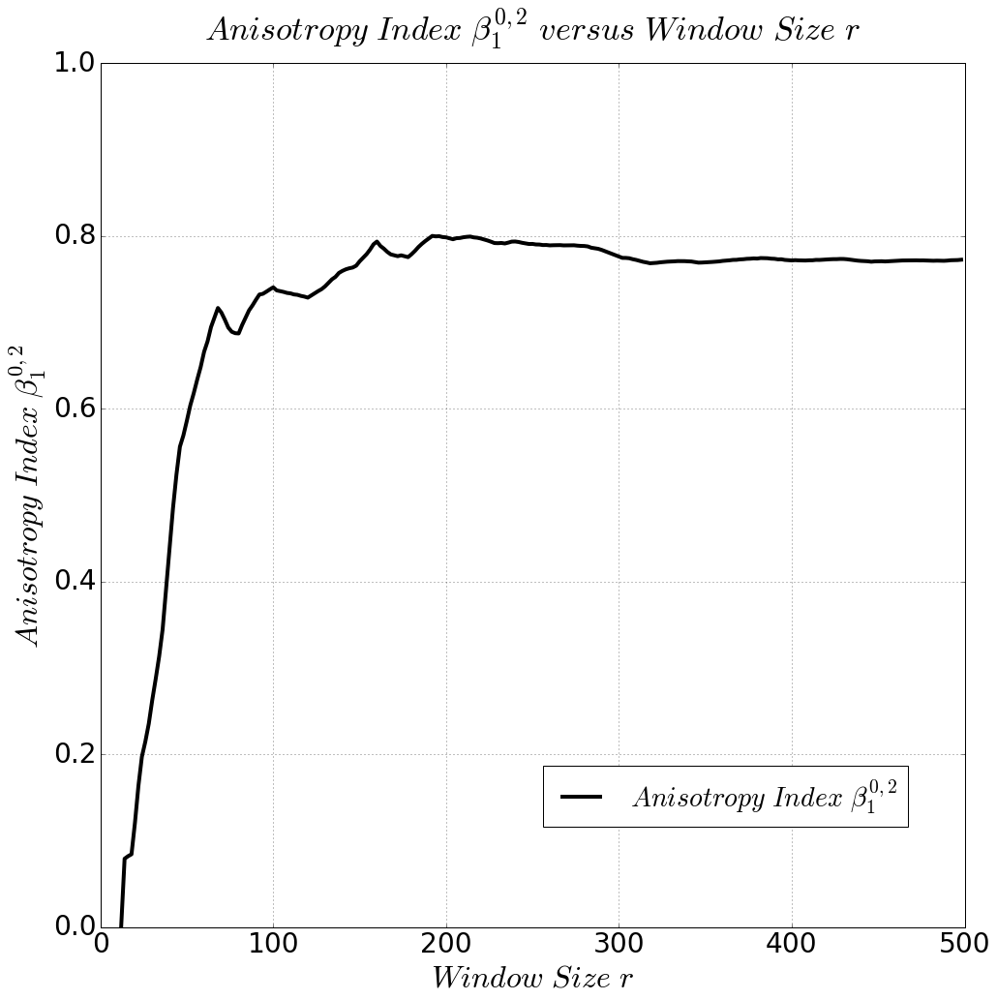

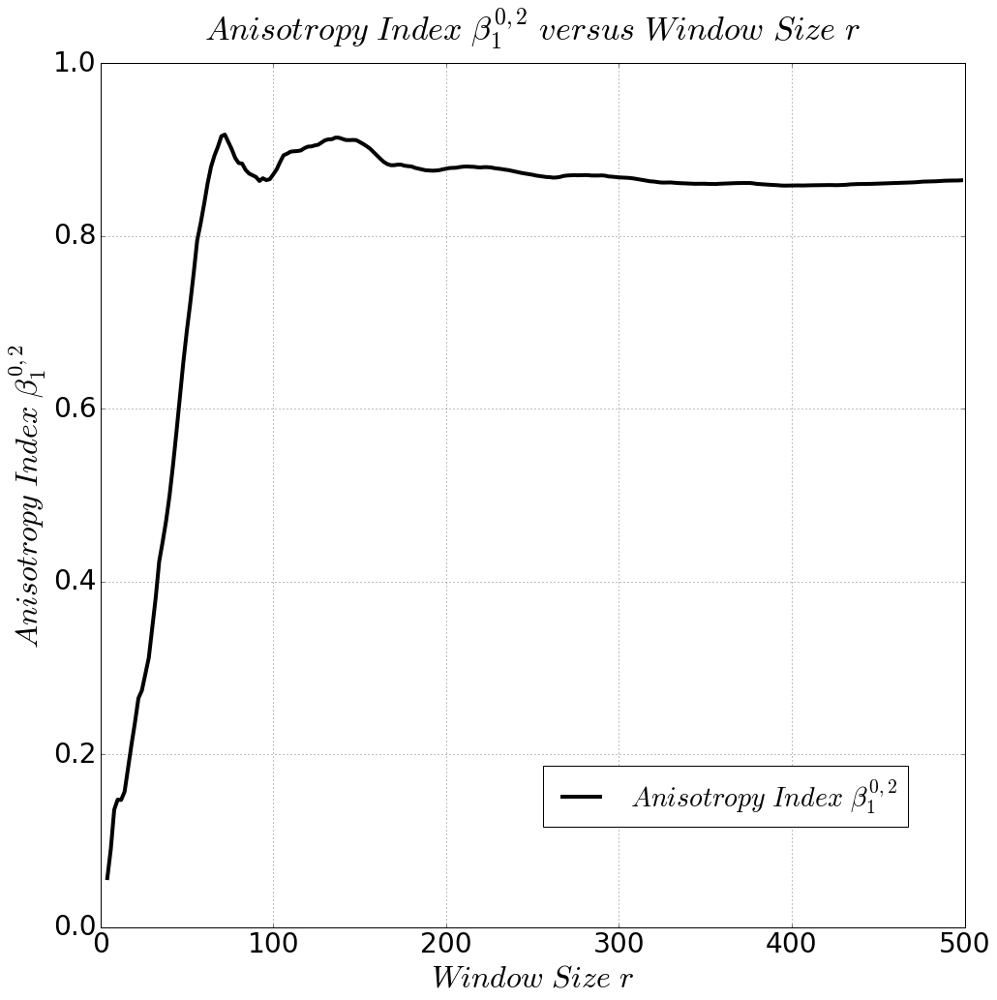

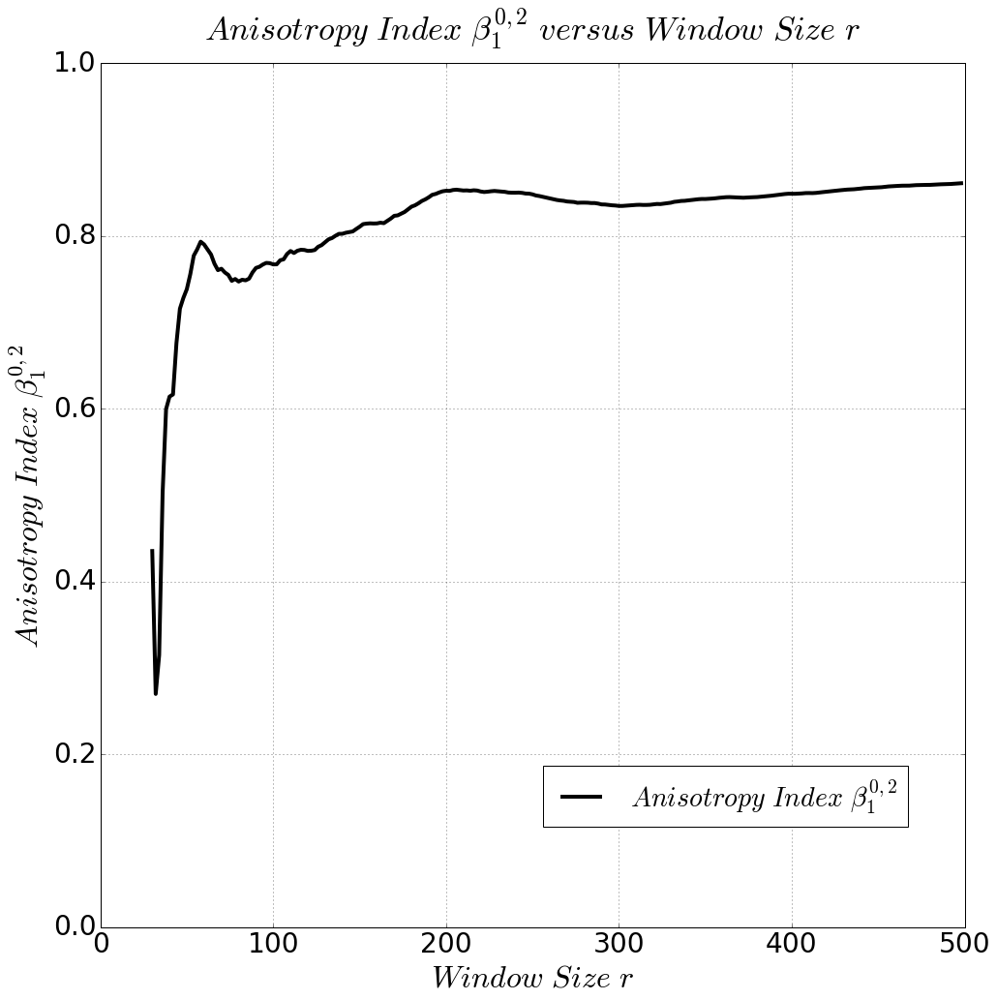

In [10]:
for sample_name in sample_names:
    fig, ax = plt.subplots(figsize=(16,16))
    dx = minkowski_data[sample_name]["dx"]
    beta1 = minkowski_data[sample_name]["beta_102"]
    
    ax.set_xlim(0, dx[-1]+2)
    ax.set_ylim(0.0, 1.0)

    ax.set_title(r'$Anisotropy \ Index \ \beta_{1}^{0,2} \ versus \ Window \ Size \ r$', fontsize=title_size, y=1.02)

    ax.set_xlabel(r'$Window \ Size \ r$', fontsize=xLabel_size)
    ax.set_ylabel(r'$Anisotropy \ Index \ \beta_{1}^{0,2}$', fontsize=yLabel_size)

    ax.plot(dx, beta1, color="black", label=r'$Anisotropy \ Index \ \beta_{1}^{0,2}$', alpha=1.0, linestyle="-", linewidth=line_width)
    
    for item in ax.get_xticklabels():
        item.set_fontsize(tick_mark_label_size)
    for item in ax.get_yticklabels():
        item.set_fontsize(tick_mark_label_size)
    
    plt.grid()
    
    legend = plt.legend(bbox_to_anchor=bbox, fontsize=legend_size)
    frame = legend.get_frame()
    frame.set_facecolor('white')
    frame.set_edgecolor('black')
    
    fig.savefig("minkowski_results/minkowski_ball_figures/only_beta_1/"+sample_name+"_minkowski_beta1.png", bbox_extra_artists=None, bbox_inches='tight', dpi=300)
plt.close()

In [ ]:
for name in sample